# 0 Loading packages <a name="loading"></a> 

In [1]:
import sys
print(sys.executable)
print(sys.path)
print(sys.version)

/home2/s418610/.conda/envs/py37_res_PAGA/bin/python
['/home2/s418610/jupyter_notebooks/03.Invivo_neuronal_reprogramming/Manuscript/to_GitHub', '', '/cm/shared/apps/cnvkit/0.9.5/lib/python3.6/site-packages', '/cm/shared/apps/python/3.6.4-anaconda/lib', '/cm/shared/apps/jupyterkernel-matlab/0.16.1/lib/python3.6/site-packages', '/cm/shared/apps/python/2.7.x-anaconda/lib', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python37.zip', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/lib-dynload', '/home2/s418610/.local/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/fa2-0.3.5-py3.7-linux-x86_64.egg', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/IPython/extensions', '/home2/s418610/.ipython']
3.7.3 (default, Mar 27 2019, 22:11:17) 
[GCC 7.3.0]


In [2]:
import re
from pathlib import Path
import numpy as np
import pandas as pd
import scipy.sparse
import sklearn.manifold
import statsmodels.api as sm

# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pyclustering.cluster.kmedoids import kmedoids

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# import seaborn as sb

import scanpy as sc
import harmonypy as hm

In [3]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
# plt.rcParams["axes.grid"] = False
sc.settings.verbosity = 3

# sc.set_figure_params(figsize=(8,8), fontsize=12)

print('numpy', np.__version__)
print('pandas', pd.__version__)
print('scipy', scipy.__version__)
print('sklearn', sklearn.__version__)
print('statsmodels', sm.__version__)
print('matplotlib', mpl.__version__)
print('seaborn', sns.__version__)

sc.logging.print_versions() # scanpy==1.4.5.post1, anndata==0.6.22.post1

!date +%F

numpy 1.17.2
pandas 0.25.2
scipy 1.3.1
sklearn 0.21.3
statsmodels 0.10.1
matplotlib 3.3.2
seaborn 0.9.0
scanpy==1.4.5.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1
2021-08-24


In [4]:
import os

# set a working directory for saving plots
wdir = "/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_revision/"
os.chdir( wdir )

In [5]:
data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/Revision/'

In [6]:
neural_data_dir = data_dir + 'NeuralOnly/'

# 1 Load and label data

### 1.1 Load datasets

In [7]:
# Load BL41 and BL42 with 10X datasets (output file of cellranger count aggr)
adata = sc.read_10x_h5('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_with_10X/1.3M_brain_11_51/aggr_10x/outs/filtered_feature_bc_matrix.h5')

reading /project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_with_10X/1.3M_brain_11_51/aggr_10x/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:03)


In [8]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [9]:
adata.X

<33145x31055 sparse matrix of type '<class 'numpy.float32'>'
	with 63963631 stored elements in Compressed Sparse Row format>

In [10]:
# The combined dataset has 33145 cells, and 31055 genes
assert adata.X.shape == (33145, 31055)

### 1.2 Add library name and batch labels as columns in adata.obs

In [11]:
# Initalize 'library_name' and 'batch' columns with empty strings
adata.obs['library_name'] = [''] * adata.X.shape[0]
adata.obs['batch'] = [''] * adata.X.shape[0]

Trying to set attribute `.obs` of view, making a copy.


In [12]:
# If cell index ends with '1', it's from library BL41, and therefore will be labeled 'BL41_reprogarmmed'; so on and so forth
# Cells from BL41 and BL42 are labeled as batch 'experiment', while cells the public 10X 1.3M brain cell dataset are labeled '10X"
for cell_index in adata.obs.index:
    if cell_index.split('-')[-1] == '1':
        adata.obs['library_name'][cell_index] = 'BL41_reprogrammed'
        adata.obs['batch'][cell_index] = 'experiment'
    elif cell_index.split('-')[-1] == '2':
        adata.obs['library_name'][cell_index] = 'BL42_control'
        adata.obs['batch'][cell_index] = 'experiment'
    elif cell_index.split('-')[-1] == '3':
        adata.obs['library_name'][cell_index] = '10X_sample11'
        adata.obs['batch'][cell_index] = '10X'
    else: 
        adata.obs['library_name'][cell_index] = '10X_sample51'
        adata.obs['batch'][cell_index] = '10X'

In [13]:
# BL41 has 6452 cells, BL42 has 5075 cells
adata.obs['library_name'].value_counts()

10X_sample11         11127
10X_sample51         10491
BL41_reprogrammed     6452
BL42_control          5075
Name: library_name, dtype: int64

In [14]:
adata.obs['batch'].value_counts()

10X           21618
experiment    11527
Name: batch, dtype: int64

### 1.3 Add lentivirus and tdTomato expression levels as columns in adata.obs

##### Due to the relatively low sequencing depth of the 10X public data, when running `cell ranger aggr`, BL41 and BL42 (esp. the latter) are greatly down-sampled. This have resulted in an even sparser readout of lenti and tdT (they are already sparse since a large fraction of the reads land in WPRE and polyA signal, which is the same between lenti and tdT loci, and these reads are therefore removed from analysis). 
##### Thus, here I try to incoporate an earlier version of the dataset when BL41 and BL42 were not aggregated with 10X libraries, but with each other

In [15]:
adata_tmp = sc.read_10x_h5('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_Lenti-Dlx2_tdTomato/aggr/aggr_10x/outs/filtered_feature_bc_matrix.h5')

reading /project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_Lenti-Dlx2_tdTomato/aggr/aggr_10x/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


In [16]:
# Aggregated BL41-42 dataset has 11527 cells and 31055 genes
assert adata_tmp.X.shape == (11527, 31055)

In [17]:
# Assert that the last two genes are lenti and tdTomato, respectively
assert np.all(adata_tmp[:,-2:].var.index == ['Lenti-hGfa-Dlx2-IRES-GFP', 'tdTomato-WPRE-bGHpA'])

In [18]:
# Initiate 'lenti_count' column with value 0
adata.obs['lenti_count'] = [0] * adata.X.shape[0]

In [19]:
# Get all cell indeces from BL41 and BL42
experiment_index = adata.obs.index[adata.obs['batch'] == 'experiment']

In [20]:
# Assert that there are 11527 cell indeces for batch 'experiment' (i.e. BL41 and BL42)
assert len(experiment_index) == 11527

In [21]:
adata.obs['lenti_count'][experiment_index] = adata_tmp[experiment_index,:][:,-2].X
adata.obs['lenti_log1p_count'] = np.log1p(adata.obs['lenti_count'])
# adata.obs['lenti_log1p_count'] = np.log2(adata.obs['lenti_count']+1)

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()
/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [22]:
# Initiate 'tdT_count' column with value 0
adata.obs['tdT_count'] = [0] * adata.X.shape[0]

In [23]:
adata.obs['tdT_count'][experiment_index] = adata_tmp[experiment_index,:][:,-1].X
adata.obs['tdT_log1p_count'] = np.log1p(adata.obs['tdT_count'])
# adata.obs['tdT_log1p_count'] = np.log2(adata.obs['tdT_count']+1)

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [24]:
adata.obs.head(10)

,library_name,batch,lenti_count,lenti_log1p_count,tdT_count,tdT_log1p_count
AAACCCAAGAACGCGT-1,BL41_reprogrammed,experiment,0.0,0.000000,1.0,0.693147
AAACCCAAGACTACGG-1,BL41_reprogrammed,experiment,0.0,0.000000,1.0,0.693147
AAACCCACACAGGATG-1,BL41_reprogrammed,experiment,3.0,1.386294,4.0,1.609438
AAACCCAGTTGGTGTT-1,BL41_reprogrammed,experiment,0.0,0.000000,6.0,1.945910
AAACCCATCCCACAGG-1,BL41_reprogrammed,experiment,1.0,0.693147,1.0,0.693147
AAACCCATCTGCTCTG-1,BL41_reprogrammed,experiment,0.0,0.000000,2.0,1.098612
AAACGAAGTCGCGGTT-1,BL41_reprogrammed,experiment,0.0,0.000000,0.0,0.000000
AAACGAAGTGGAGAAA-1,BL41_reprogrammed,experiment,0.0,0.000000,0.0,0.000000
AAACGCTCATTAGGAA-1,BL41_reprogrammed,experiment,17.0,2.890372,12.0,2.564949
AAACGCTGTAGACAAT-1,BL41_reprogrammed,experiment,2.0,1.098612,4.0,1.609438


# 2 Preprocessing

### 2.1 Remove doublets predicted by Scrublet

In [25]:
df_scrub = pd.read_csv(data_dir+'df_annot.csv', index_col=0)

In [26]:
df_scrub

,library_name,batch,doublet_scores,predicted_doublets
AAACCCAAGAACGCGT-1,BL41_reprogrammed,experiment,0.117166,False
AAACCCAAGACTACGG-1,BL41_reprogrammed,experiment,0.021014,False
AAACCCACACAGGATG-1,BL41_reprogrammed,experiment,0.033644,False
AAACCCAGTTGGTGTT-1,BL41_reprogrammed,experiment,0.040927,False
AAACCCATCCCACAGG-1,BL41_reprogrammed,experiment,0.020183,False
...,...,...,...,...
TTTGTCAGTGCTTCTC-4,10X_sample51,10X,0.055944,False
TTTGTCATCAGTCAGT-4,10X_sample51,10X,0.101761,False
TTTGTCATCATTGCCC-4,10X_sample51,10X,0.078859,False
TTTGTCATCGCCATAA-4,10X_sample51,10X,0.073210,False


In [27]:
# Make sure the cell IDs are in the same order between df_scrub and adata
assert sum(df_scrub.index == adata.obs_names) == adata.shape[0]

In [28]:
adata.obs[['doublet_scores', 'predicted_doublets']] = df_scrub[['doublet_scores', 'predicted_doublets']]

In [29]:
cell_idx_singlet = [not is_doublet for is_doublet in adata.obs['predicted_doublets']]

In [30]:
sum(cell_idx_singlet)

32100

In [31]:
adata = adata[cell_idx_singlet, :]

In [32]:
# Only 32100 cells left
assert adata.shape == (32100, 31055)

### 2.2 Quality control: filter out low-quality cells and low-expression genes

In [33]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_count'] = adata[:, mt_gene_mask].X.sum(1)
adata.obs['mt_frac'] = adata.obs['mt_count']/adata.obs['n_counts']

Trying to set attribute `.obs` of view, making a copy.


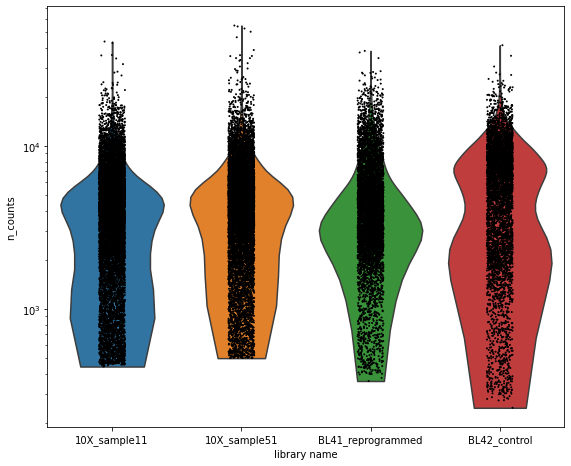

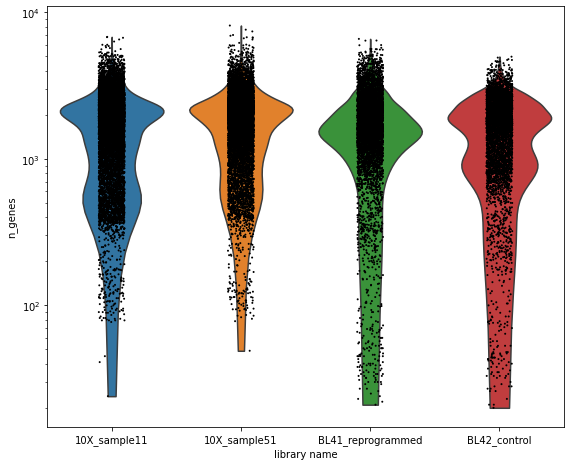

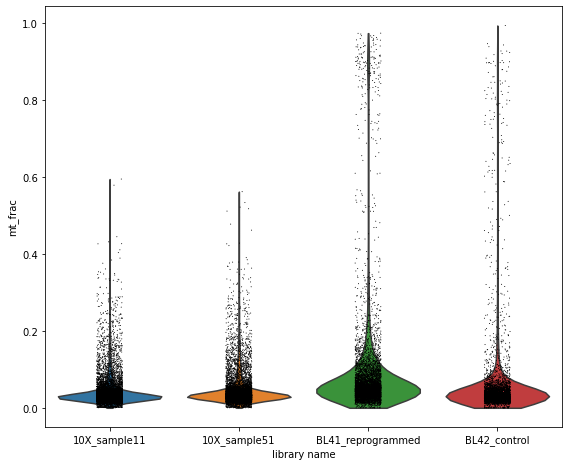

In [36]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='library_name', size=2, log=True, cut=0, save='_ReprNeru_E18-5_n_counts.pdf')
t1 = sc.pl.violin(adata, 'n_genes', groupby='library_name', size=2, log=True, cut=0, save='_ReprNeru_E18-5_n_genes.pdf')
t2 = sc.pl.violin(adata, 'mt_frac', groupby='library_name')

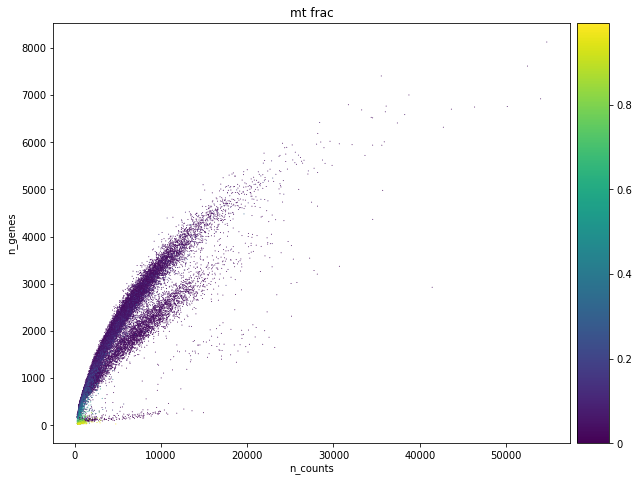

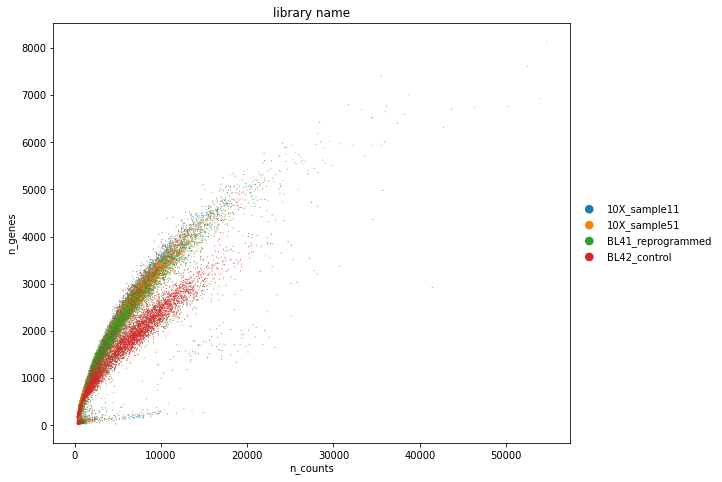

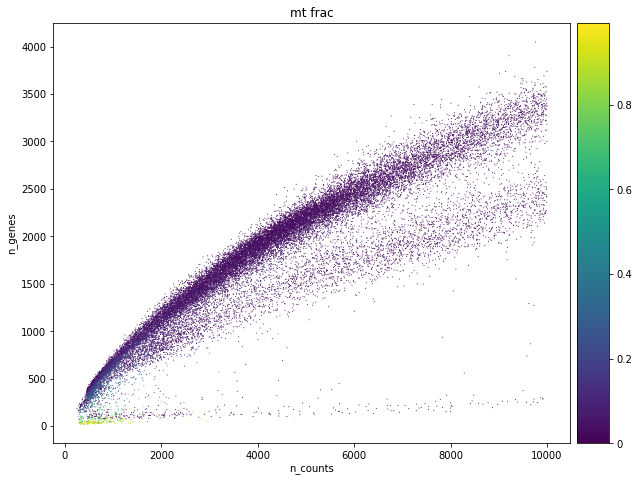

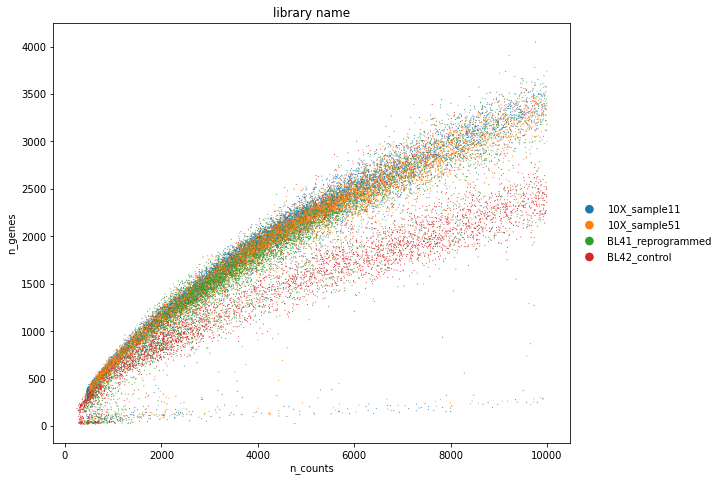

In [35]:
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='mt_frac')
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='library_name')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='library_name')

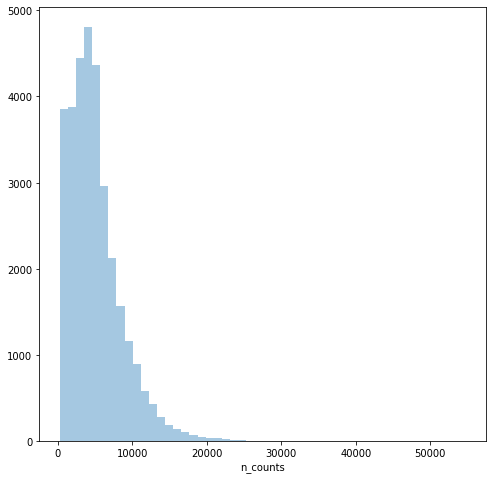

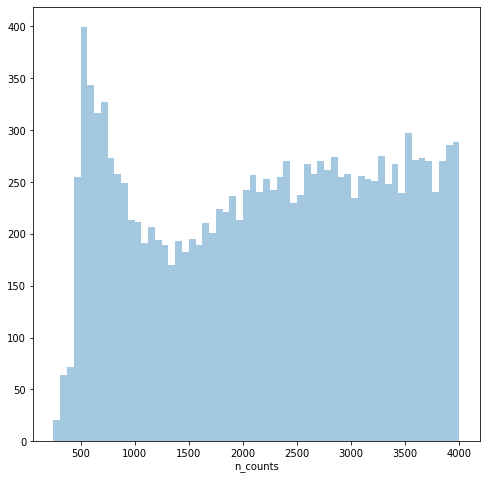

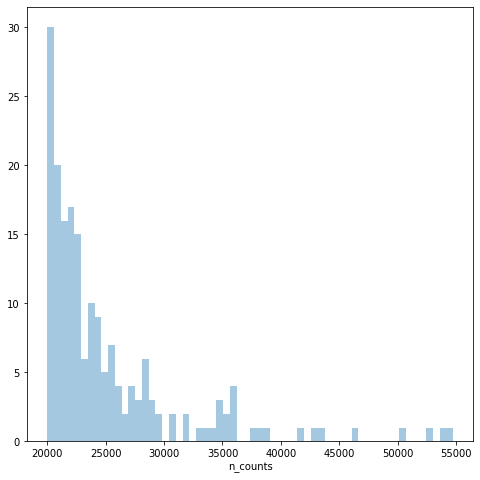

In [36]:
#Thresholding decision: counts
p3 = sns.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=60)
plt.show()

p5 = sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']>20000], kde=False, bins=60)
plt.show()

In [37]:
# Visual cutoffs for counts: >500 and <45,000

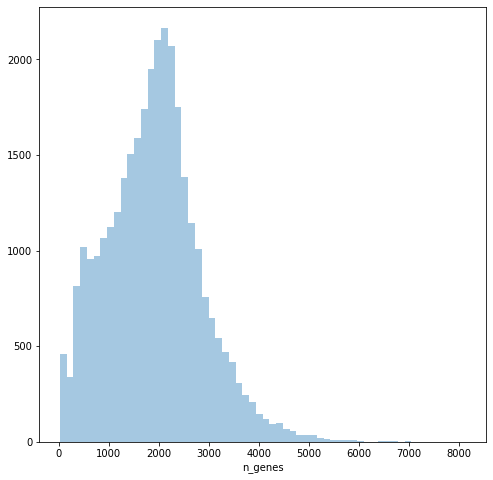

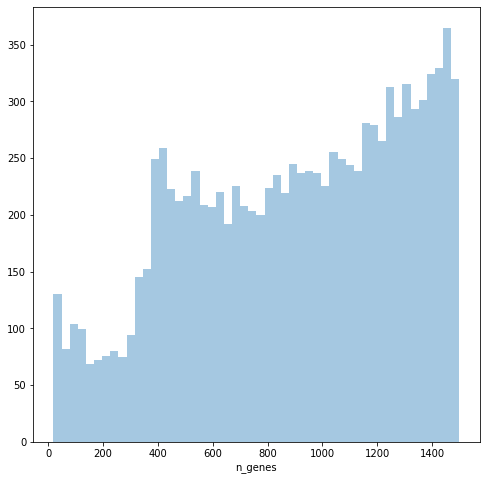

In [38]:
#Thresholding decision: genes
p6 = sns.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata.obs['n_genes'][adata.obs['n_genes']<1500], kde=False, bins=50)
plt.show()

In [39]:
# Visual cutoff for genes >400

In [40]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 500)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 45000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['mt_frac'] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 400)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Total number of cells: 32100
filtered out 416 cells that have less than 500 counts
Number of cells after min count filter: 31684
filtered out 5 cells that have more than 45000 counts
Number of cells after max count filter: 31679
Number of cells after MT filter: 30893
filtered out 562 cells that have less than 400 genes expressed


Trying to set attribute `.obs` of view, making a copy.


Number of cells after gene filter: 30331


In [41]:
genes_positivecells = (adata.X.toarray() > 0).T.sum(axis=1)

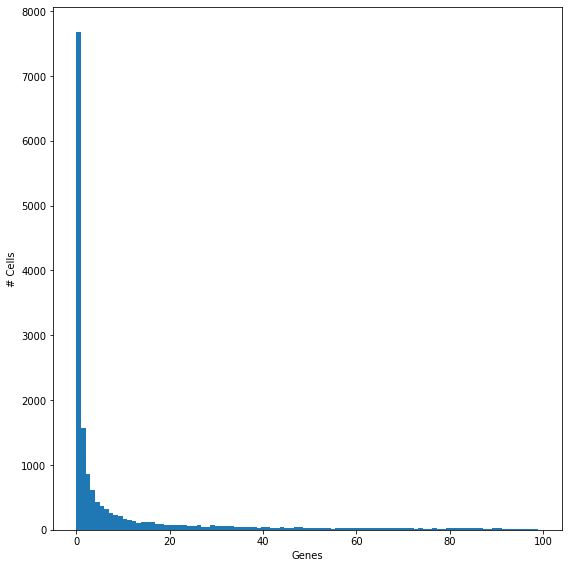

In [42]:
num_bins = 100

fig, ax = plt.subplots()

# the histogram of the data
n, bins, patches = ax.hist(genes_positivecells[genes_positivecells<100], num_bins, density=0)

ax.set_xlabel('Genes')
ax.set_ylabel('# Cells')

fig.tight_layout()
plt.show()

In [43]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 10 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31055
filtered out 12532 genes that are detected in less than 10 cells
Number of genes after cell filter: 18523


In [44]:
# 30608 cells and 18536 genes passed filtering
assert adata.X.shape == (30331, 18523)

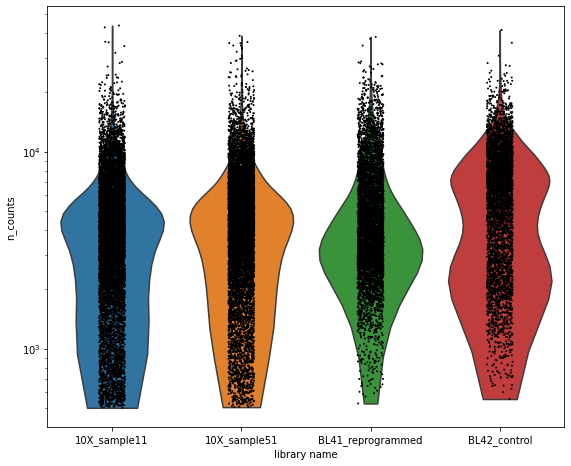

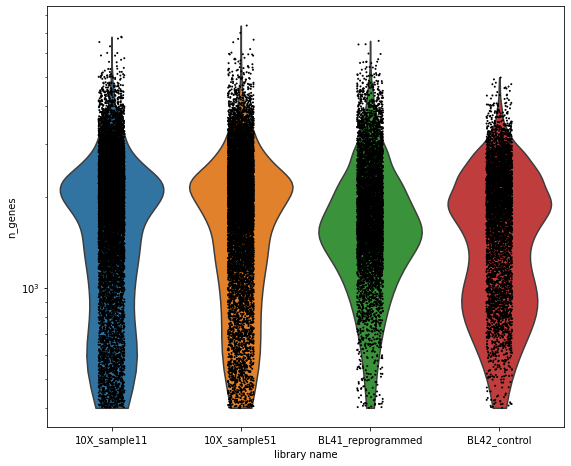

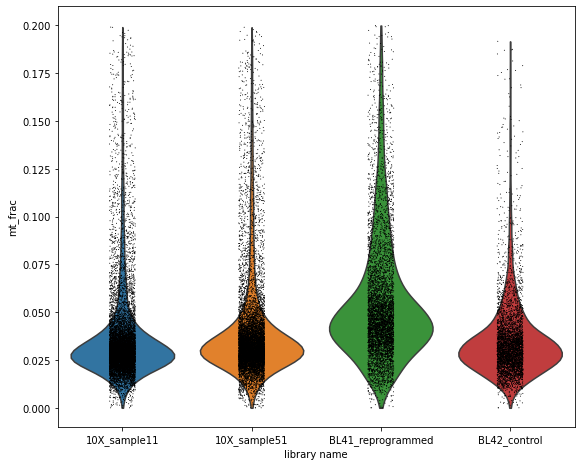

In [39]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='library_name', size=2, log=True, cut=0, save='_ReprNeru_E18-5_n_counts.pdf')
t1 = sc.pl.violin(adata, 'n_genes', groupby='library_name', size=2, log=True, cut=0, save='_ReprNeru_E18-5_n_genes.pdf')
t2 = sc.pl.violin(adata, 'mt_frac', groupby='library_name')

In [45]:
adata.write(data_dir + 'BL41-42_10X-samples11_51_postFiltering.h5ad')

### 2.3 Log transform read count matrix, and save it in adata.raw
#### Also, save the read count matrix in adata.layers beforehand

In [38]:
adata = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 30331 × 18523 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'

In [9]:
adata.obs['batch'].value_counts()

10X           19964
experiment    10367
Name: batch, dtype: int64

In [10]:
adata.obs['library_name'].value_counts()

10X_sample11         10131
10X_sample51          9833
BL41_reprogrammed     5756
BL42_control          4611
Name: library_name, dtype: int64

In [48]:
#Keep the count data in a counts layer
adata.layers['counts'] = adata.X.copy()

In [49]:
# Natural log-transform the data
sc.pp.log1p(adata)

In [50]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [51]:
adata.write(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log.h5ad')

# 3 Batch correction with Harmony

In [52]:
adata = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log.h5ad')

In [53]:
adata

AnnData object with n_obs × n_vars = 30331 × 18523 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'library_name_colors'
    layers: 'counts'

### 3.1 Calculating and keep top 2500 Highly Variable Genes (HVGs) with scanpy

In [54]:
n_genes = 2500

sc.pp.recipe_zheng17(adata, n_top_genes = 2500, log=False) # log=False as adata.X is already log-transformed

running recipe zheng17
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
    finished (0:00:03)


In [56]:
# Make sure adata has the correct shape
assert adata.X.shape == (30331, 2500)

### 3.2 Performing PCA with scanpy

In [57]:
sc.tl.pca(adata, n_comps=50)

computing PCA with n_comps = 50
    finished (0:00:01)


In [58]:
adata

AnnData object with n_obs × n_vars = 30331 × 2500 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

### 3.3 Running Harmony

Note: Harmony needs PCs as input. 

In [59]:
# Make sure data dimensonality is good
assert adata.X.shape == (30331, 2500)
assert adata.obsm['X_pca'].shape == (30331, 50)

In [60]:
meta_data = adata.obs # adata.obs can be used directly as metadata
vars_use = ['batch', 'library_name'] # Multi-variate correction: first correct between batch, 
                                     # then correct within batch between libraries
data_mat = adata.obsm['X_pca'] # Initial data is PCA output

In [61]:
ho = hm.run_harmony(data_mat, meta_data, vars_use, max_iter_kmeans=50) # Run Harmony till convergence

2021-07-28 15:16:35,368 - harmonypy - INFO - Iteration 1 of 50
2021-07-28 15:16:49,958 - harmonypy - INFO - Iteration 2 of 50
2021-07-28 15:16:59,354 - harmonypy - INFO - Iteration 3 of 50
2021-07-28 15:17:08,655 - harmonypy - INFO - Iteration 4 of 50
2021-07-28 15:17:21,425 - harmonypy - INFO - Iteration 5 of 50
2021-07-28 15:17:31,368 - harmonypy - INFO - Converged after 5 iterations


In [62]:
# ho.Z_corr holds the corrected matrix, but transposed
assert ho.Z_corr.shape == (50, 30331)

In [63]:
adata.obsm['Harmony'] = ho.Z_corr.T

In [64]:
adata

AnnData object with n_obs × n_vars = 30331 × 2500 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'X_pca', 'Harmony'
    varm: 'PCs'
    layers: 'counts'

In [65]:
adata.obsm['Harmony']

array([[ 6.9605637 , -6.416072  , 11.763466  , ...,  0.34778336,
        -0.26345   , -0.31686333],
       [-4.665254  , -0.72864777,  0.4747178 , ...,  0.7604189 ,
        -0.3353541 , -0.08127806],
       [22.974794  , -5.2114725 , -0.24039619, ..., -0.973436  ,
         2.5064585 , -0.8903631 ],
       ...,
       [ 6.8775034 , -6.0098696 , 11.560094  , ...,  0.86736774,
        -0.20600526,  0.08679166],
       [-1.6760296 , 16.200542  ,  0.05029218, ...,  1.6885769 ,
        -1.8256806 ,  1.847135  ],
       [13.242843  , 10.0267725 ,  9.817939  , ..., -1.9442574 ,
        -0.98376447, -0.06573489]], dtype=float32)

In [66]:
adata.write(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony.h5ad')

# 4 Clustering and cell typing

In [67]:
adata = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony.h5ad')

### 4.1 Louvain clustering and single-cell embedding with PAGA

computing neighbors


/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostic

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:11)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 23 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:03)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:02)
--> added 'pos', the PAGA positions (adata.uns['paga'])


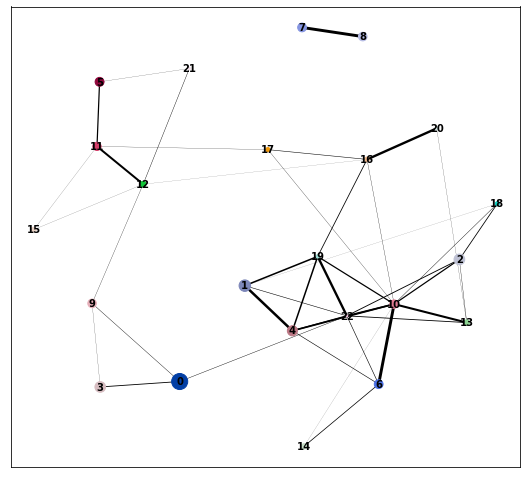

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:36)


In [68]:
sc.pp.neighbors(
    adata,
    use_rep='Harmony',  
#    random_state=random_seed 
)

sc.tl.louvain(
    adata,
    resolution=0.50,
#    random_state=random_seed
)

sc.tl.paga(
    adata,
    groups='louvain', 
)

sc.pl.paga(
    adata, 
    color=['louvain'], 
    use_raw=True,
    layout='fr',
    threshold=0.01,
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed,
)

sc.tl.umap(
    adata,
    init_pos='paga',
#    random_state=random_seed,
)

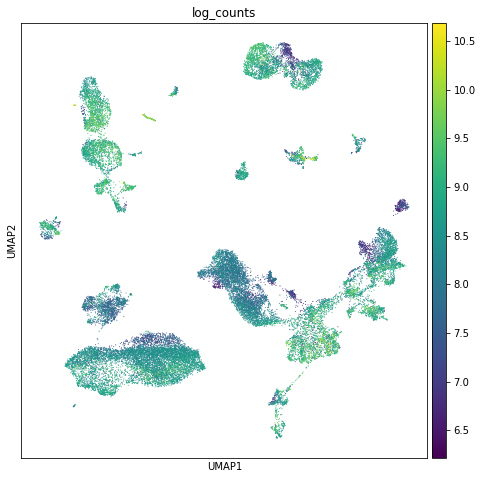

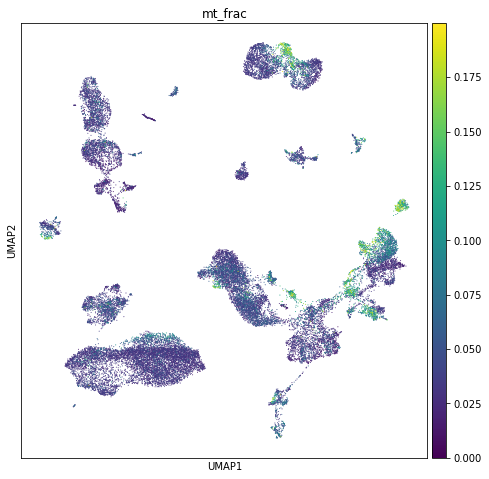

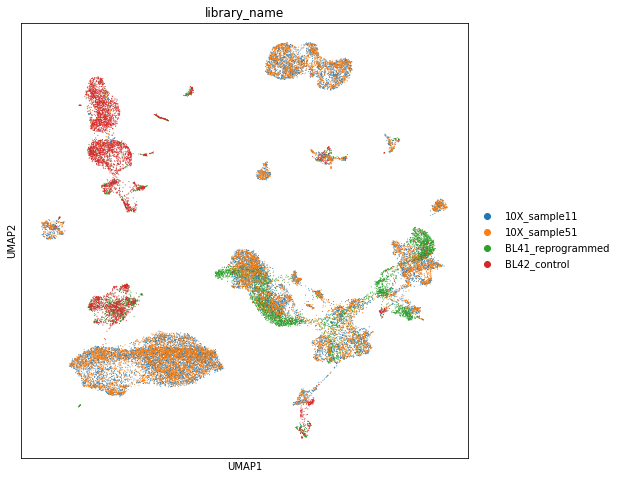

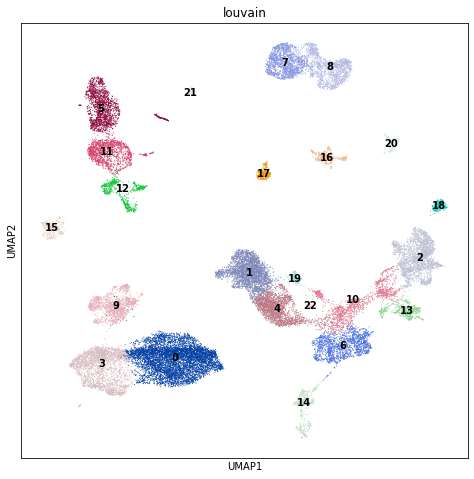

In [69]:
# Visualize sequencing depth, library distribution, and Louvain clusters
sc.pl.umap(adata, color='log_counts')
sc.pl.umap(adata, color='mt_frac')
sc.pl.umap(adata, color='library_name')
sc.pl.umap(adata, color='louvain', legend_loc='on data', )

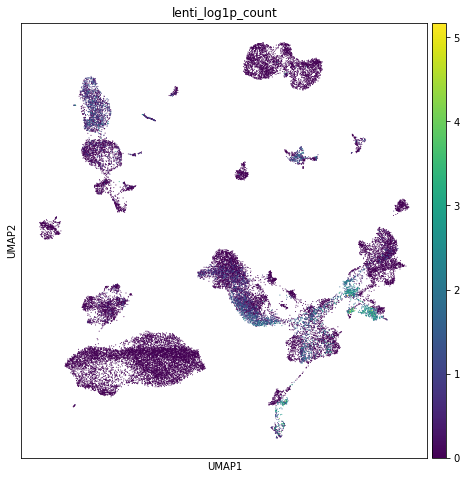

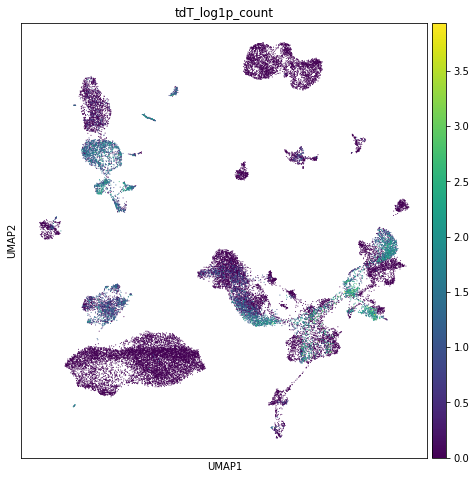

In [70]:
# Visualize lentivirus and tdT expression levels
sc.pl.umap(adata, color='lenti_log1p_count')
sc.pl.umap(adata, color='tdT_log1p_count')

In [71]:
adata.write(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain.h5ad')

### 4.2 Coarse cell typing

In [72]:
adata = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain.h5ad')

#### References: 
Brain cell typing: Cell types in the mouse cortex and hippocampus revealed by single-cell RNA-seq (Zeisel et al. 2015), and A single-cell atlas of mouse brain macrophages reveals unique transcriptional identities shaped by ontogeny and tissue environment (Van Hove et al. 2019)


M1 and M2 macrophages: Different distributions of M1 and M2 macrophages in a mouse model of laser-induced choroidal neovascularization (Zhou et al. 2017)

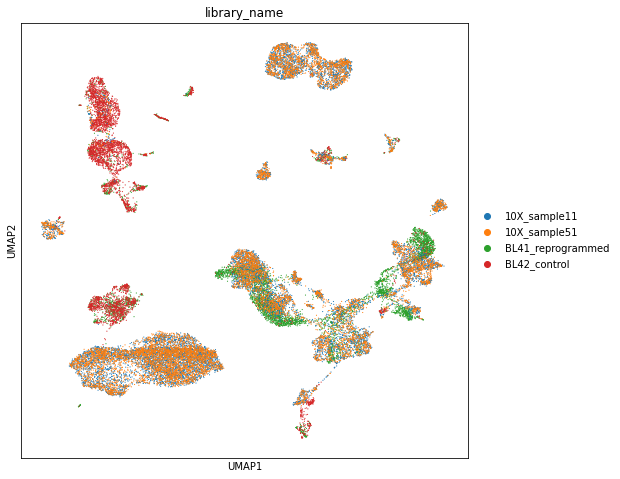

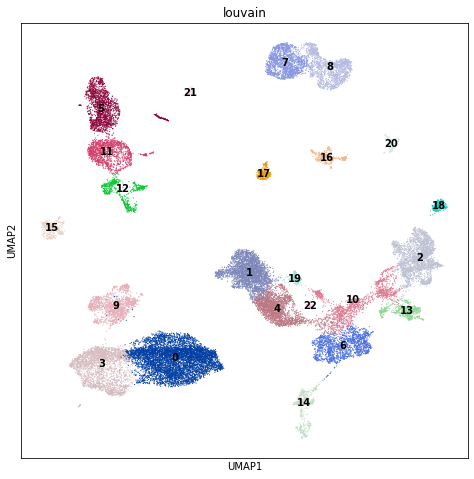

In [73]:
sc.pl.umap(adata, color='library_name', size=5, 
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

sc.pl.umap(adata, color='louvain', size=5, legend_loc='on data' , 
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.1 Endothelial cells = cluster 16

Vwf is an endothelial marker gene, which umambiguously marks cluster 16

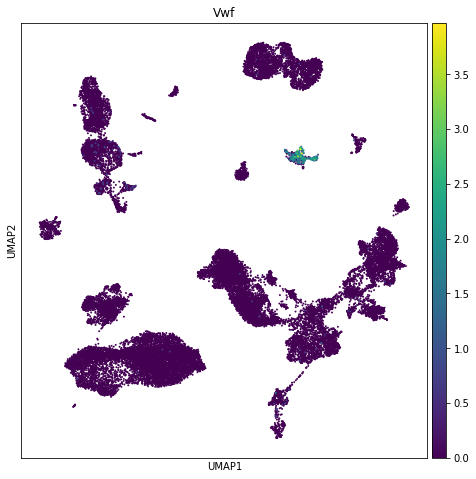

In [75]:
# Cluster 16 = Endothelial cells
sc.pl.umap(adata, color=['Vwf'], size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.2 Microglial cells = cluster 5

Microglial cells are 'C1qa' and 'Sparc' double-positive. 

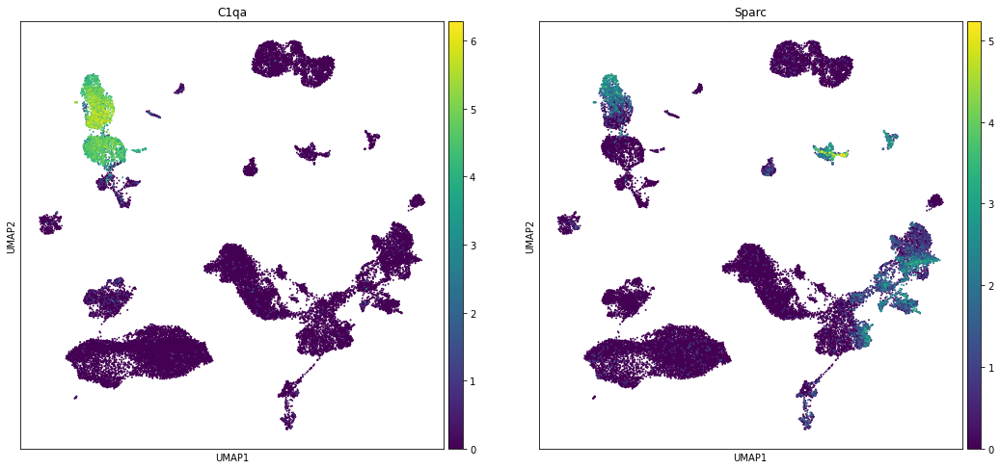

In [76]:
# Cluster 5 = Microglia
sc.pl.umap(adata, color=['C1qa', 'Sparc'], size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.3 Myeloid cells

#### Macrophages = cluster 11

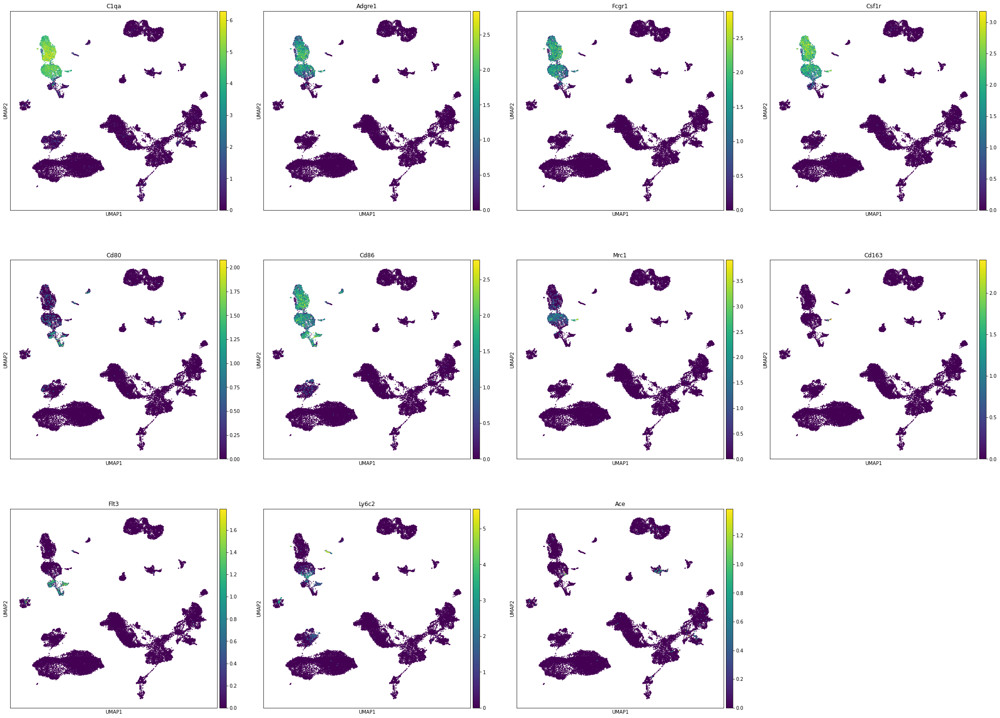

In [77]:
# Cluster 11 = Macrophages, with M1 and M2 subtypes
sc.pl.umap(adata, color=['C1qa', 'Adgre1', 'Fcgr1', 'Csf1r',  # Pan-macrophage markers
                         'Cd80', 'Cd86', # M1 macrophage markers
                         'Mrc1', 'Cd163', # M2 macrophage markers
                        'Flt3', 'Ly6c2', 'Ace'], # should be negative
           size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### Monocyte-derived Cells = part of cluster 11, and part of cluster 12

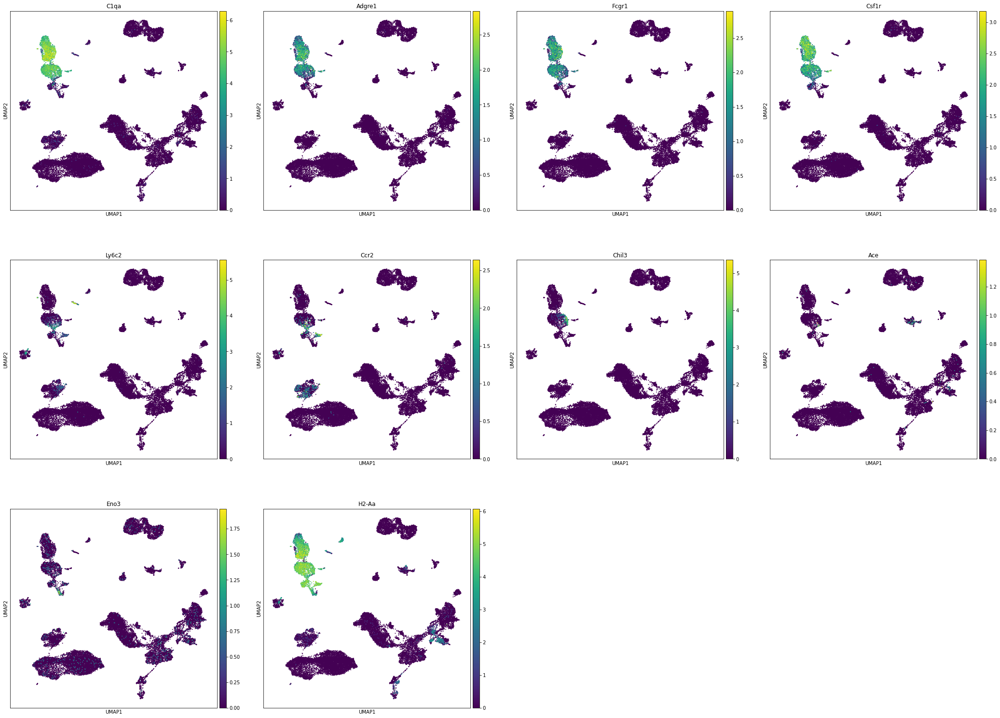

In [78]:
# Monocyte-derived cells (MdC): C1qa lo, Adgre1 int, Fcgr1 int, Csf1r int, Ly6c2hi, Ccr2 hi, Chil3-, Ace-, Eno3-, H2-Aa+
sc.pl.umap(adata, color=['C1qa', # lo
                         'Adgre1', 'Fcgr1', 'Csf1r',  # int
                         'Ly6c2', 'Ccr2', # hi
                         'Chil3', 'Ace', 'Eno3', # neg
                        'H2-Aa'], # pos
           size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### Dendritic cell = clusters 12, 15

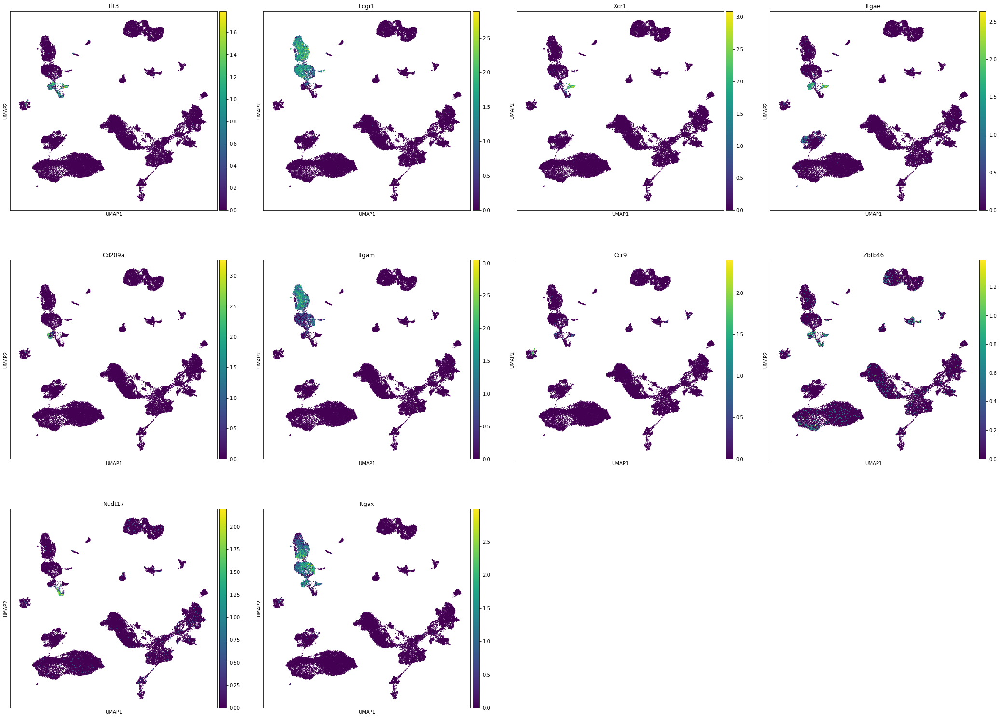

In [79]:
# Dendritic cells have 4 subtypes: conventional dendritic cells-1 and -2 (cDC1 and cDC2), plasmacytoid 
#                                  dendritic cells (pDC), and migratory dendritic cell (migratory DC)
sc.pl.umap(adata, color=[
                        'Flt3', # pos for all DC
                        'Fcgr1', # neg for all DC
                        'Xcr1', 'Itgae', # positive for cDC1
                        'Cd209a', 'Itgam', # positive for cDC2
                        'Ccr9',  # positive for pDC
                        'Zbtb46', #neg for pDC
                        'Nudt17', # Positive for Migratory DC
                        'Itgax', # pos for all but migratory
                         ],
           size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )
# Conclusions: It seems part of cluster 15 is pDC (Ccr9+), and cluster 12 contains all of the other 3 subtypes of DC. 
# This overlaps with MdC. Interesting. 

Didn't find: classical and non-classical monocytes.

#### 4.2.4 Lymphoid cells

#### T cells = cluster 9

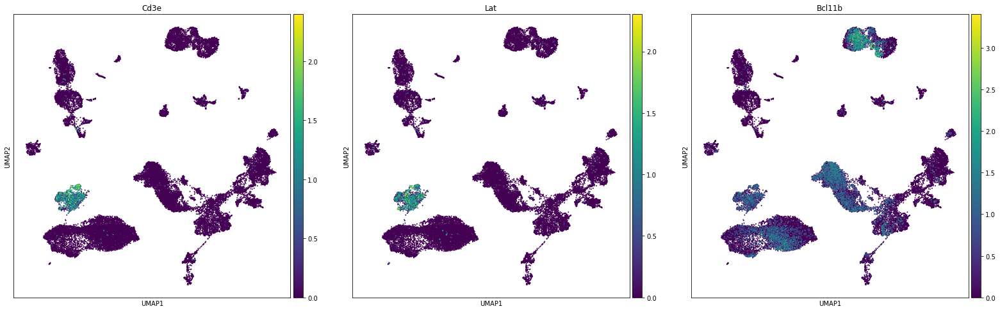

In [80]:
# T cells: Cd3e+, Lat+, Bcl11b+

sc.pl.umap(adata, color=['Cd3e', 
                         'Lat', 'Bcl11b'], size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### Innate lymphoid cells = part of cluster 9

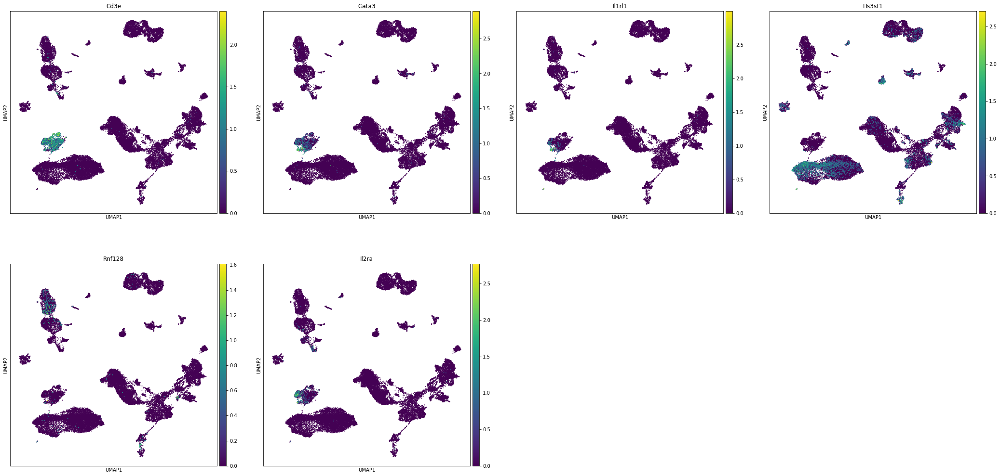

In [81]:
# Innate lymphoid cells: Cd3e-, Gata3hi, Il1rl1+, Hs3st1+, Rnf128+, Il2ra+
sc.pl.umap(adata, color=['Cd3e', 
                         'Gata3', 'Il1rl1', 'Hs3st1', 'Rnf128', 'Il2ra'], size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### B cells = cluster 21

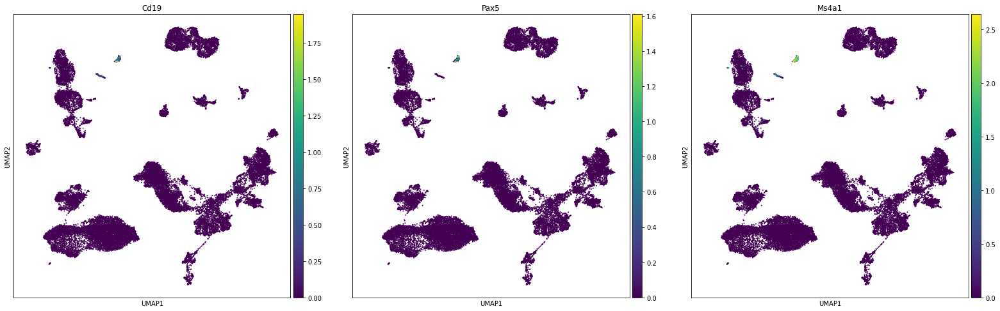

In [82]:
# B cells: Cd19+, Pax5+, Ms4a1+

sc.pl.umap(adata, color=['Cd19', 'Pax5', 'Ms4a1'], size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

# B cells = Cluster 21

#### 4.2.5 Mural cells = cluster 20

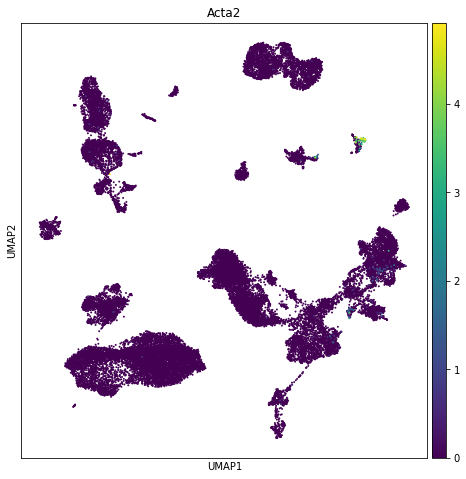

In [83]:
sc.pl.umap(adata, color=['Acta2'], size=15, use_raw=True,
#           save='_louvain_clusters_r0.5_annotated.pdf'
          )

#### 4.2.6 Erothyroblasts-like = cluster 22

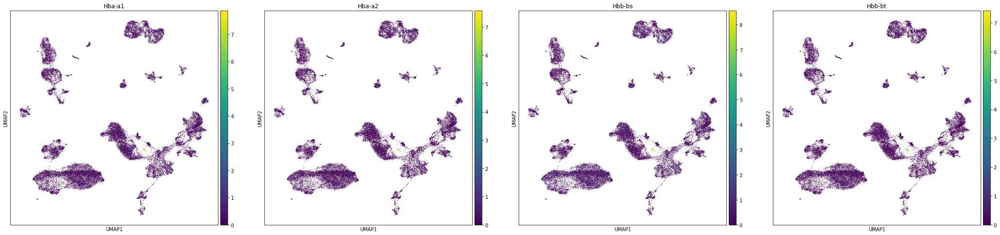

In [84]:
sc.pl.umap(adata, color=['Hba-a1', 'Hba-a2', 'Hbb-bs', 'Hbb-bt'], 
           use_raw=True) 

#### 4.2.7 Neural cells (neuronal cells and glial cells)

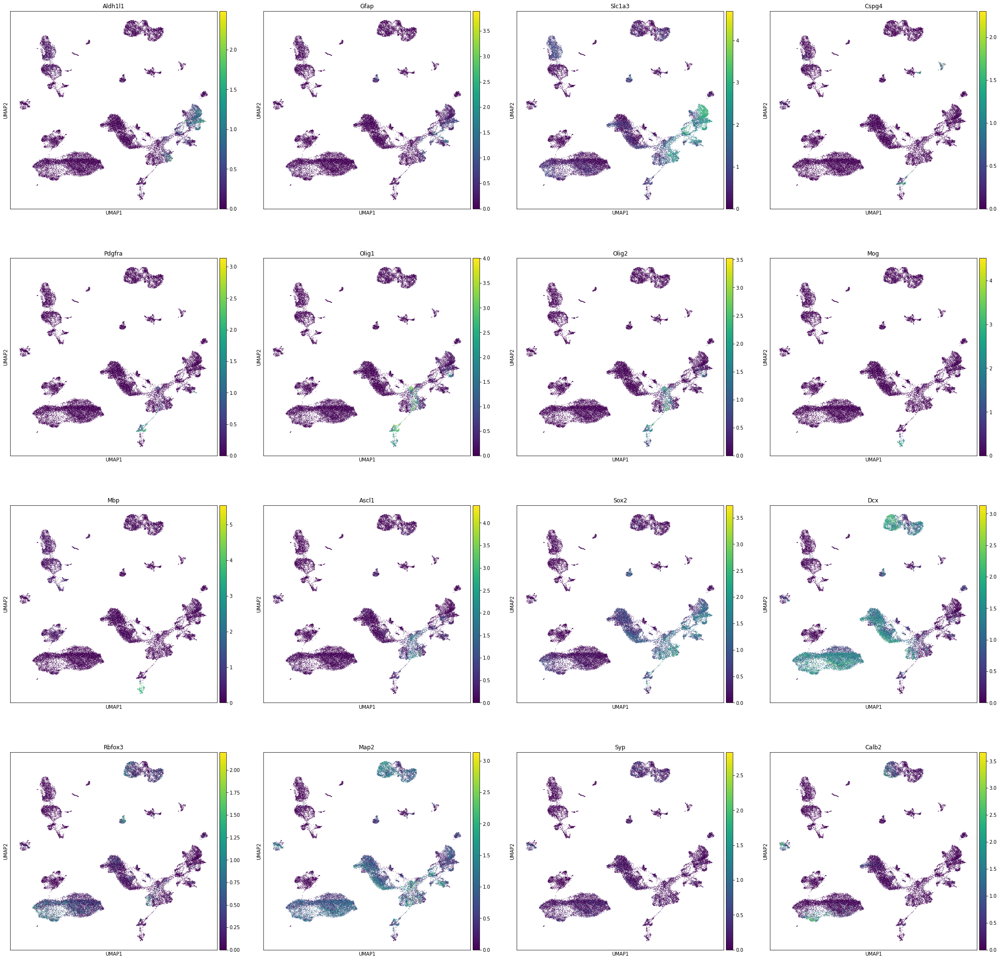

In [85]:
sc.pl.umap(adata, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers; clusters 2, 13 ,and parts of 6, 10
                         'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers; top half of cluster 14
                         'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers; bottom half of cluster 14
                         'Ascl1', 'Sox2', # Neural stem/progenitor cells markers; clusters 6, 10, interestingly, non-overlapping with Aldh1l1 expr
                         'Dcx', # Neuroblast marker; clusters 1, 4, and parts of 6 and 10
                         'Rbfox3', 'Map2', 'Syp', # Mature neuron markers; somewhat in cluster 1
                         'Calb2'], # GABAergic neuron marker; tip of cluster 1
           use_raw=True) 

#### 4.2.7 Re-labeling clusters

In [86]:
adata.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22'],
      dtype='object')

In [101]:
# Summarize the findings and label the clusters
adata.obs['louvain'].cat.categories = ['WT E18.5 neurons-1', 'Neuroblasts-1', 'Astrocytes', 'WT E18.5 neurons-2', 'Neuroblasts-2',
                                       'Microglia', 'NPCs', 'WT E18.5 neurons-3', 'WT E18.5 neurons-4',
                                       'Lymphoid cells', 'Lenti-astrocytes/NPCs', 'Macrophages', 
                                       'Dendritic cells', 'Lenti-astrocytes', 'NG2 glia/oligodendrocytes', 
                                       'WT E18.5 mature neurons', 'Endothelial cells',
                                       'WT E18.5 neurons-5', 'WT E18.5 neurons-6', 'Unidentified', 
                                       'Mural cells', 'B cells', 'Erythroblast-like']

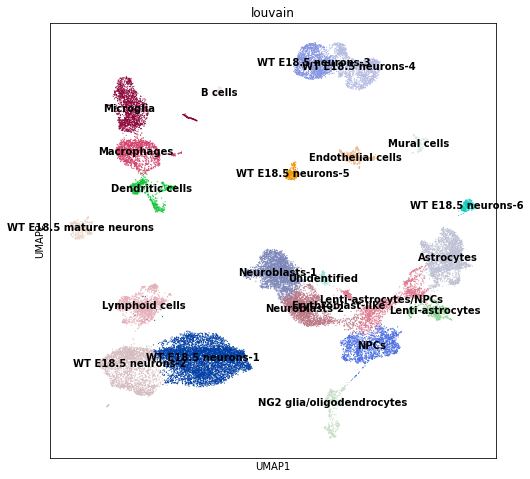

In [102]:
sc.pl.umap(adata, color='louvain', legend_loc='on data', size=5, 
          save='_AllCells_louvain_annot.pdf'
          )

In [103]:
marker_genes = ['Vwf',  # Endothelial
                'Acta2', # Mural cells
                'C1qa', 'Sparc', # Microglia
                'Adgre1', 'Fcgr1', # Macrophages
                'Ly6c2', 'Ccr2', # Monocyte-derived cells (lymhpoid)
                'Flt3', # Dendritic cells
                'Cd3e', 'Lat', # T cells (lymphoid)
                'Pax5', 'Ms4a1', # B cells
                'Hba-a1', 'Hbb-bs', # Hemoglobin: erythroblast-like
                'Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers
                'Cspg4', 'Pdgfra', # NG2-glia markers
                'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers
                'Ascl1', 'Sox2', # Neural stem/progenitor cells markers
                'Dcx', # Neuroblast marker
                'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                'Calb2' # GABAergic neuron marker
               ]

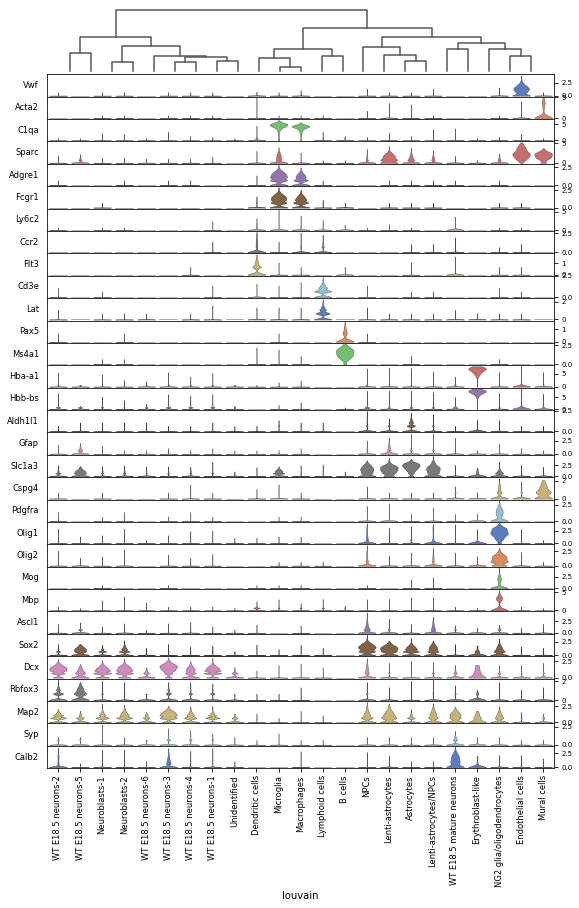

In [104]:
# Figure S2B
ax = sc.pl.stacked_violin(adata, marker_genes, groupby='louvain', dendrogram=True, swap_axes=True,
#                          var_group_positions= [(0, 0), (2,3)], var_group_labels=['Endothelial', 'Microglial'],
                          figsize=(10, 14), 
                          use_raw=True, 
                         save='_allCells_marker_panel.pdf' 
                         )

In [108]:
adata_plot = adata[adata.obs['louvain'].isin(['Astrocytes', 'Lenti-astrocytes', 'Lenti-astrocytes/NPCs', 
                                              'NPCs', 'Neuroblasts-1', 'Neuroblasts-2', 'NG2 glia/oligodendrocytes']), :]

In [109]:
marker_genes_subset = ['Aldh1l1', 
                       # 'Gfap', 
                       'Slc1a3', # Astrocyte markers
                       #'Cspg4', 
                       'Ascl1', 
                       'Dcx', # Neuroblast marker
                       #'Sox2', # Neural stem/progenitor cells markers
                       'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                       'Olig1', 'Olig2', 
                       #'Mog', 
                       'Mbp', # Oligodendrocyte markers
                      ]

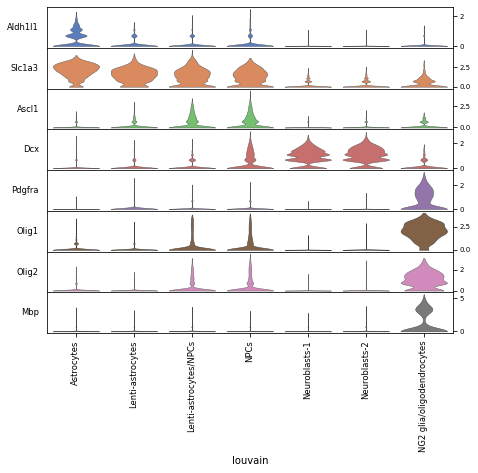

In [110]:
# Figure 2C
ax = sc.pl.stacked_violin(adata_plot, marker_genes_subset, groupby='louvain', dendrogram=False, swap_axes=True,
#                          var_group_positions= [(0, 0), (2,3)], var_group_labels=['Endothelial', 'Microglial'],
                          figsize=(8, 6), 
                          use_raw=True, 
                          order=['Astrocytes', 'Lenti-astrocytes', 'Lenti-astrocytes/NPCs',
                                 'NPCs', 'Neuroblasts-1', 'Neuroblasts-2', 'NG2 glia/oligodendrocytes'],
                          save='_neuralCells_marker_subpanel.pdf'
                         )

In [111]:
adata.write(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

### 4.3 BL41 is enriched in neural cells compared to BL42

In [113]:
adata = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony_PAGA_louvain_annot.h5ad')

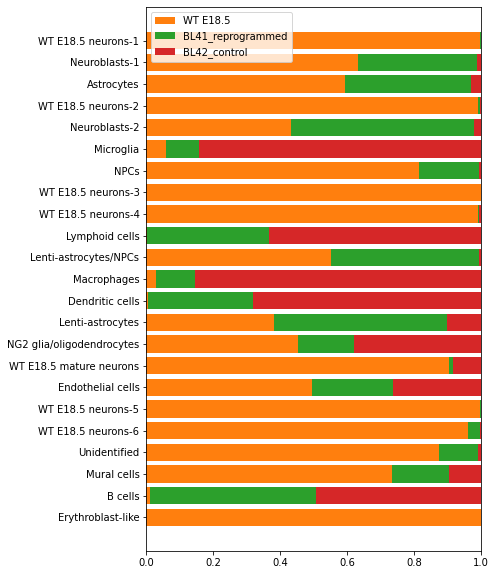

In [115]:
# Plot cell type compoisition of BL41 and BL42
fig, ax = plt.subplots(figsize=(6,10))
N = len(adata.obs['louvain'].cat.categories)

# Sample11_louvain_proportions = (adata.obs[adata.obs['library_name']=='10X_sample11']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
# Sample51_louvain_proportions = (adata.obs[adata.obs['library_name']=='10X_sample51']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
WT_proportions = (adata.obs[adata.obs['library_name'].isin(['10X_sample11','10X_sample51'])]['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
BL41_louvain_proportions = (adata.obs[adata.obs['library_name']=='BL41_reprogrammed']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))
BL42_louvain_proportions = (adata.obs[adata.obs['library_name']=='BL42_control']['louvain'].value_counts(sort=False) / adata.obs['louvain'].value_counts(sort=False))

ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence


ax.barh(ind, WT_proportions, align='center', color=adata.uns['library_name_colors'][1])
ax.barh(ind, BL41_louvain_proportions, align='center', 
        left=WT_proportions, color=adata.uns['library_name_colors'][2])
ax.barh(ind, BL42_louvain_proportions, align='center', 
        left=WT_proportions+BL41_louvain_proportions, color=adata.uns['library_name_colors'][3])


ax.set_yticks(ind)
ax.set_yticklabels(adata.obs['louvain'].cat.categories)
ax.invert_yaxis()  # labels read top-to-bottom
# ax.set_xlabel('Performance')
# ax.set_title('How fast do you want to go today?')
plt.legend(('WT E18.5', 'BL41_reprogrammed', 'BL42_control'))

plt.savefig('./figures/hbar_allCells_louvain_r0.5_cluster_composition.pdf')

plt.show()

In [116]:
df_composition = pd.concat([WT_proportions, BL41_louvain_proportions, BL42_louvain_proportions], axis=1)

In [117]:
df_composition.columns = ['WT E18.5 fraction', 'lenti-DLX2 fraction', 'lenti-GFP control fraction']

In [118]:
df_composition.to_csv('cell_cluster_source_composition.csv')

# 5 Pseudotime analysis

### 5.1 Removing cell clusters that are unrelated to reprogramming

i.e. Keep clusters 'Astrocytes', 'Lenti-astrocytes', 'Lenti-astrocytes/NPCs', 'NPCs', 'Neuroblasts-1', 'Neuroblasts-2', 'NG2 glia/oligodendrocytes' for downstream analysis. 'WT E18.5 neurons-6' contains some Lenti-DLX2 cells, but are not convincingly neurons. In fact, they have the highest mitochondrial reads and lowest overall read counts, which is likely why they cluster separately from neuroblasts. 

#### 5.1.1 Create a filter

In [119]:
clusters_include = ['Astrocytes', 'Lenti-astrocytes', 'Lenti-astrocytes/NPCs', 'NPCs', 'Neuroblasts-1', 'Neuroblasts-2', 'NG2 glia/oligodendrocytes']

In [120]:
index_include = []
for index in adata.obs.index:
    if adata.obs['louvain'][index] in clusters_include: 
        index_include.append(index)

In [122]:
assert len(index_include) == 11654

#### 5.1.2 Subset full dataset

In [123]:
# Read Harmonized, but unclustered single-cell data
adata_tmp = sc.read(data_dir + 'BL41-42_10X-samples11_51_postFiltering_log_pcs50_Harmony.h5ad')

In [125]:
adata_neural = adata_tmp[index_include,:]

In [126]:
adata_neural.var_names_make_unique()

In [127]:
adata_neural

View of AnnData object with n_obs × n_vars = 11654 × 2500 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [128]:
del adata_tmp

In [129]:
adata_neural.write(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

#### 5.1.3 Re-cluster cells with finer resolution 

In [130]:
adata_neural = sc.read(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

computing neighbors


/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


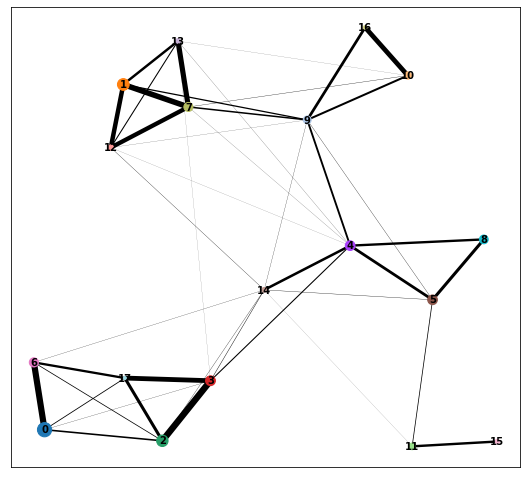

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [131]:
sc.pp.neighbors(
    adata_neural,
#    use_rep='X_pca',  
    use_rep='Harmony',  
#    random_state=random_seed
)

sc.tl.louvain(
    adata_neural,
    resolution=1.00,
#    resolution=1.50,
    #    random_state=random_seed
)

sc.tl.paga(
    adata_neural,
    groups='louvain',  
)

sc.pl.paga(
    adata_neural, 
    color=['louvain'], 
    use_raw=True,
#    use_raw=False,
#    layout='fa', 
    layout='fr', 
    threshold=0.01, 
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed, 
#     save='_AllNeural_PAGA_connectivity.pdf'
)

sc.tl.umap(
    adata_neural,
    init_pos='paga', 
#    random_state=random_seed,
)

#sc.pl.pca_scatter(adata, color='n_counts')
#sc.pl.pca_scatter(adata, color='library_name')
#sc.pl.tsne(adata, color='n_counts')

In [132]:
adata_neural.write(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

In [7]:
adata_neural = sc.read(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

In [178]:
# Make the two WT E18.5 libraries' colors consistent
adata_neural.uns['library_name_colors'][0] = adata_neural.uns['library_name_colors'][1]

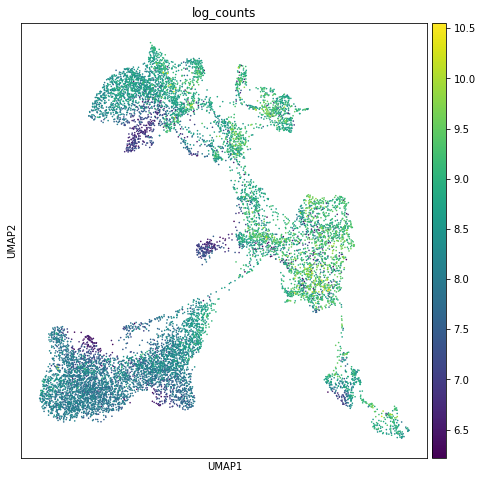

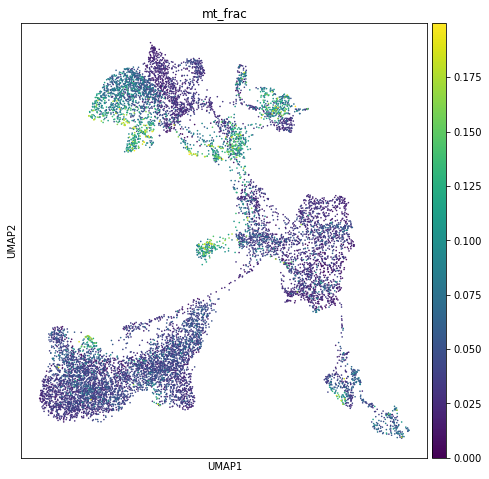

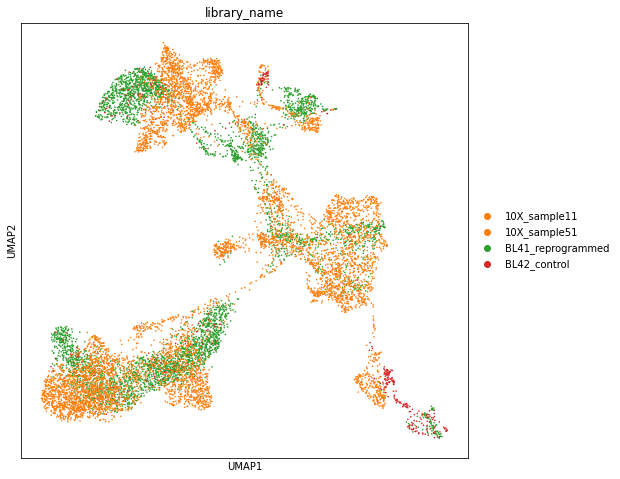

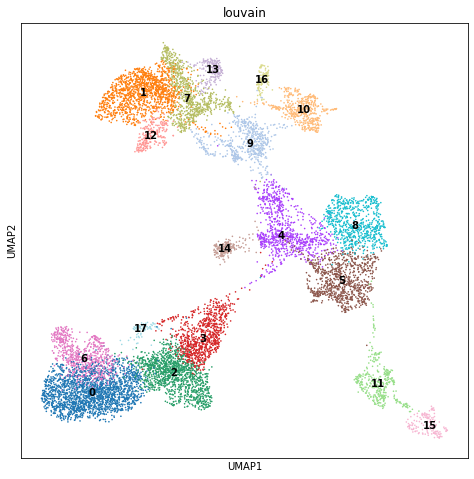

In [179]:
# Visualize sequencing depth, library distribution, and Louvain clusters
sc.pl.umap(adata_neural, color='log_counts', 
#          save='_AllNeural_log_counts.pdf'
          )
sc.pl.umap(adata_neural, color='mt_frac', 
#           save='_AllNeural_mt_frac.pdf'
          )
sc.pl.umap(adata_neural, color='library_name', 
#          save='_AllNeural_library_name.pdf'
          )
sc.pl.umap(adata_neural, color='louvain', legend_loc='on data', 
#          save='_AllNeural_louvain.pdf'
          )

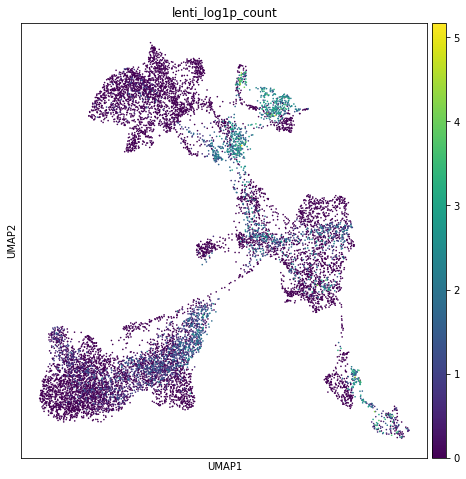

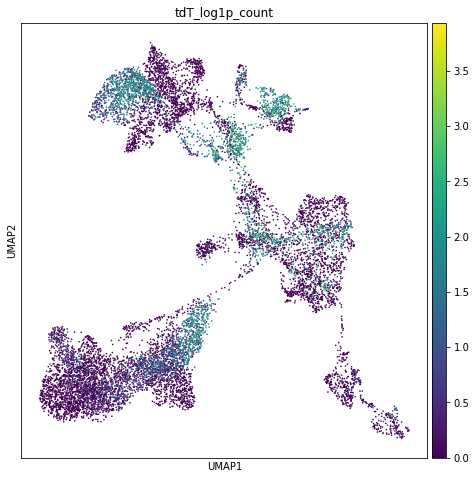

In [180]:
# Visualize lenti and tdT expression
sc.pl.umap(adata_neural, color='lenti_log1p_count', 
#          save='_AllNeural_log_counts.pdf'
          )
sc.pl.umap(adata_neural, color='tdT_log1p_count', 
#           save='_AllNeural_mt_frac.pdf'
          )

#### 5.1.4 Annotate clusters

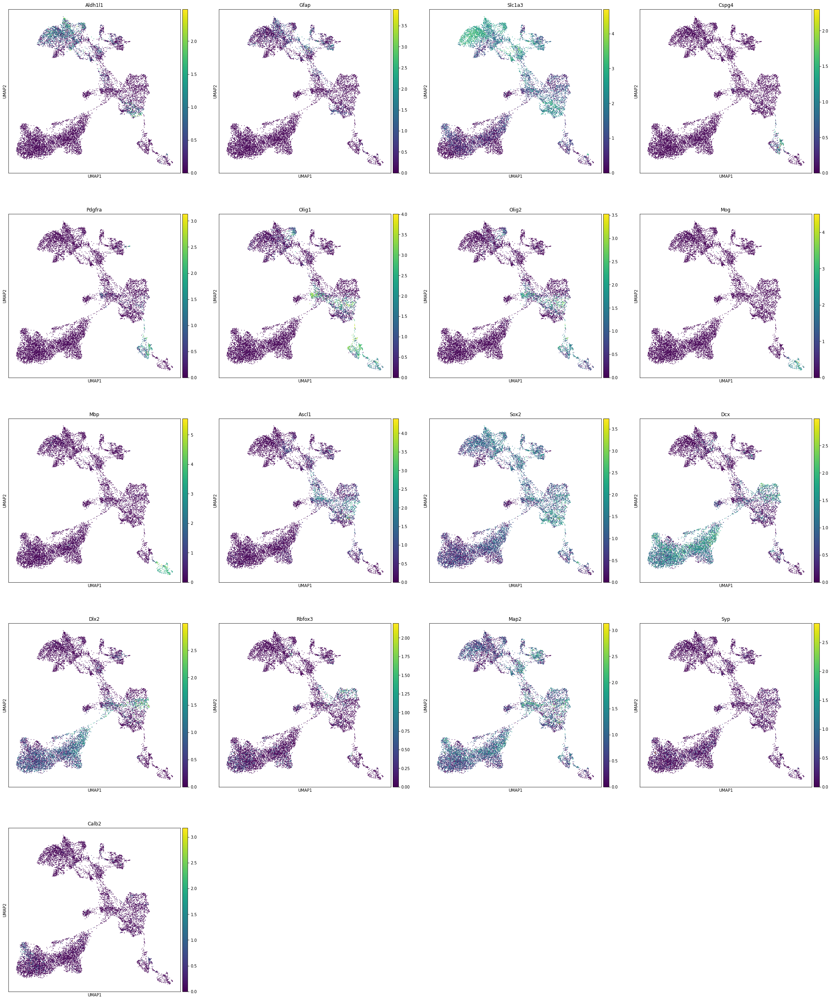

In [139]:
sc.pl.umap(adata_neural, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers; clusters 1, 7, 12, 13
                         'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers; cluster 11
                         'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers; cluster 15
                         'Ascl1', 'Sox2', # Neural stem/progenitor cells markers; clusters 4, 5, 8
                         'Dcx', 'Dlx2', # Neuroblast marker; clusters 0, 2, 3, 6, 17
                         'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                         'Calb2'], # GABAergic neuron marker
           use_raw=True) 
# Clusters 9, 10, 16 are lenti-astrocytes

In [181]:
adata_neural.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17'],
      dtype='object')

In [182]:
# Summarizing the findings: 
adata_neural.rename_categories('louvain', ['Neuroblasts-1', 'Resident astrocytes', 'Neuroblasts-2', 'Neuroblasts-3', 
                                           'NPCs-1', 'NPCs-2', 'Neuroblasts-4', 'Astrocytes/qNSCs-1', 'NPCs-3', 'Lenti-astrocytes-1', 
                                           'Lenti-astrocytes-2', 'NG2 glia', 'Astrocytes/qNSCs-2', 'Astrocytes/qNSCs-3', 'Unidentified', 
                                           'Oligodendrocytes', 'Lenti-astrocytes-3', 'Neuroblasts-5'])

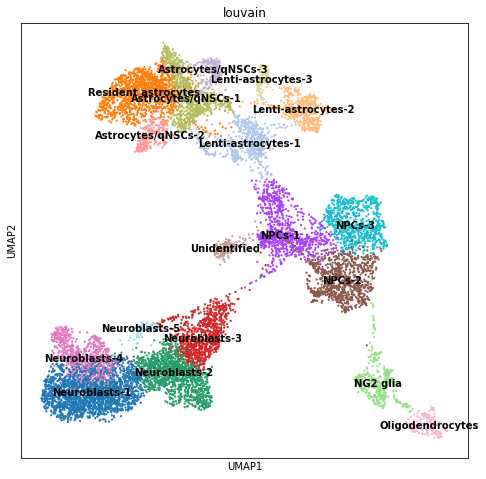

In [8]:
sc.pl.umap(adata_neural, color='louvain', legend_loc='on data', size=20,
#           save='_AllNeural_louvain_annot.pdf'
          )

In [9]:
marker_genes_subset = ['Aldh1l1', 
                       # 'Gfap', 
                       'Slc1a3', # Astrocyte markers
                       #'Cspg4', 
                       'Ascl1', 
                       'Dcx', # Neuroblast marker
                       #'Sox2', # Neural stem/progenitor cells markers
                       'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
                       'Olig1', 'Olig2', 
                       #'Mog', 
                       'Mbp', # Oligodendrocyte markers
                      ]

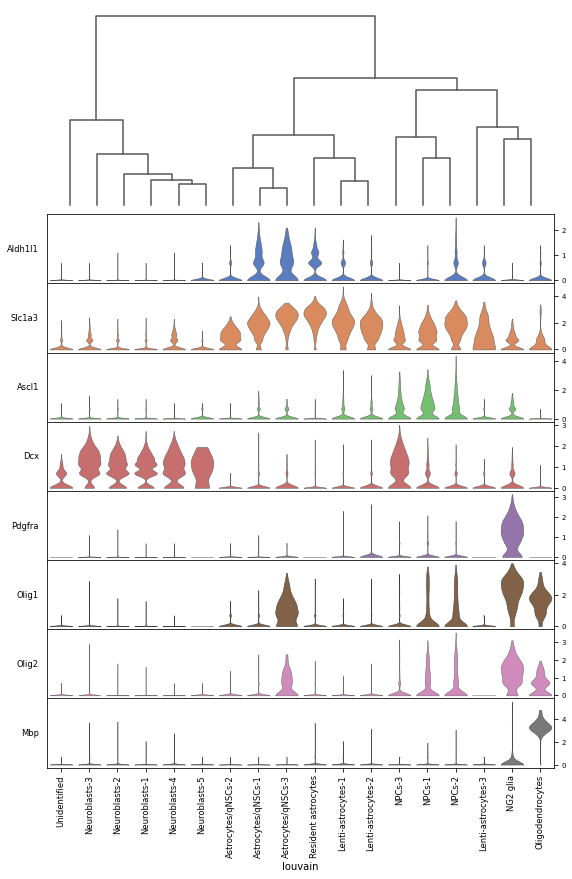

In [10]:
ax = sc.pl.stacked_violin(adata_neural, marker_genes_subset, groupby='louvain', dendrogram=True, swap_axes=True,
                          figsize=(10, 14), 
                          use_raw=True, 
                         save='_allCells_MT_marker_panel.pdf' 
                         )

#### 5.1.5 Explore possibility of oligodendrocyte reprogramming

In [186]:
adata_NG2 = adata_neural[adata_neural.obs['louvain']=='NG2 glia']

In [187]:
adata_oligo = adata_neural[adata_neural.obs['louvain']=='Oligodendrocytes']

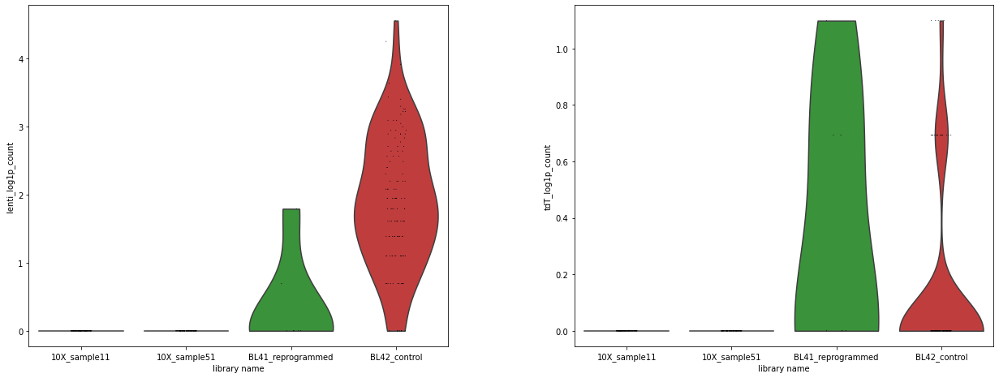

In [188]:
sc.pl.violin(adata_NG2, keys=['lenti_log1p_count', 'tdT_log1p_count'], groupby='library_name', use_raw=True)

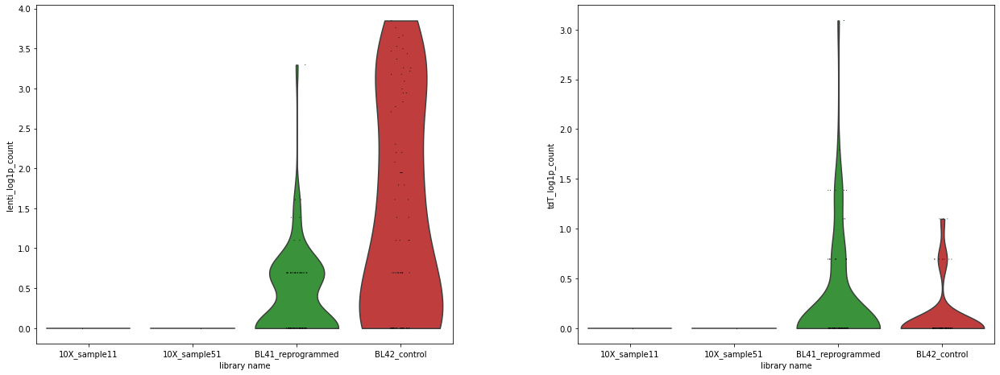

In [189]:
sc.pl.violin(adata_oligo, keys=['lenti_log1p_count', 'tdT_log1p_count'], groupby='library_name', use_raw=True)

In [190]:
adata_neural.write(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann.h5ad')

### 5.2 Pseudotime analysis

In [7]:
adata_neural = sc.read(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann.h5ad')

In [192]:
# Choose a random cell from resident astrocytes as the root of pseudotime
adata_neural.uns['iroot'] = np.flatnonzero(adata_neural.obs['louvain']=='Resident astrocytes')[0]

In [193]:
sc.tl.dpt(adata_neural)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99895984 0.9985258  0.99653023 0.99434453 0.9938093
     0.98599786 0.98409307 0.9825034  0.9795584  0.97661257 0.970387
     0.96792984 0.96179354 0.9582868 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


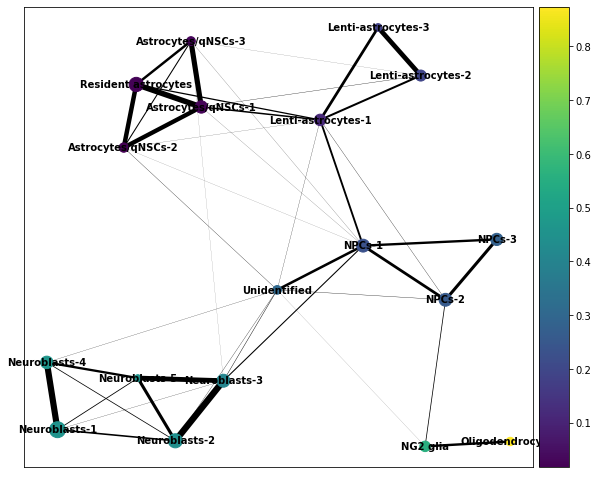

In [194]:
sc.pl.paga(adata_neural, color=['dpt_pseudotime'], use_raw=True)

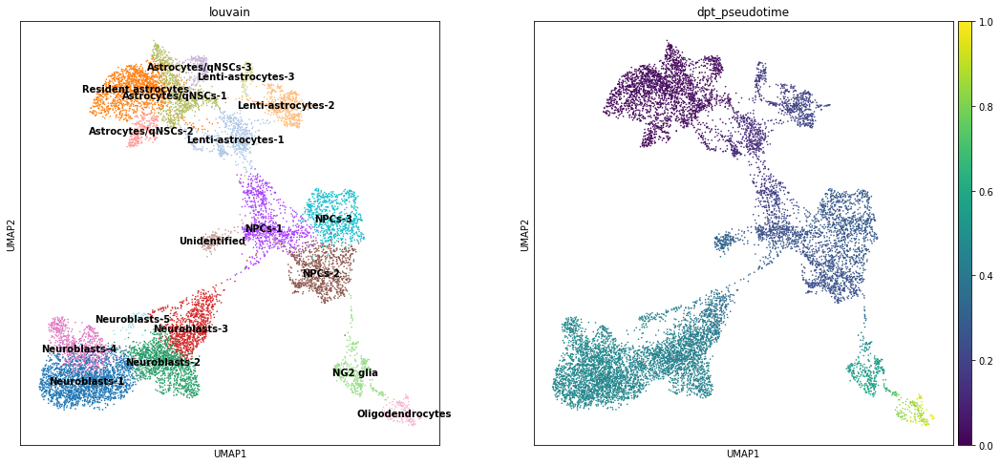

In [195]:
sc.pl.umap(adata_neural, color=['louvain', 'dpt_pseudotime'], legend_loc='on data')

In [196]:
# Calculate order of Louvain clusters based on their median pseudotime
pseudotime_median = []
for cluster in adata_neural.obs['louvain'].cat.categories:
    pseudotime_median.append(adata_neural.obs['dpt_pseudotime'][adata_neural.obs['louvain']==cluster].median())

data = {'clusters': adata_neural.obs['louvain'].cat.categories, 'pseudotime_median': pseudotime_median}

pd_pseudotime = pd.DataFrame(data=data)

pd_pseudotime.sort_values(by='pseudotime_median', inplace=True)

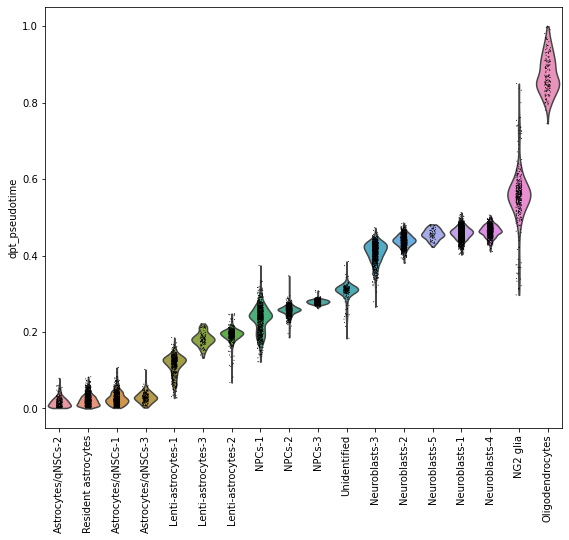

In [197]:
# Plot pseudotime in each cluster
sc.pl.violin(adata_neural, 'dpt_pseudotime', groupby='louvain', use_raw=True, rotation=90, order=pd_pseudotime['clusters'])

This ordering is consistent with the cluster labels, and suggests that the reprogrammed cells goes as follows:
1. Resident astrocytes
2. Lenti-astrocytes
3. NPCs (1->2->3)
4. Neuroblasts (3->2->1->4)

Notes:
* Since we are capturing very few NG2 glia from lenti-DLX2 mice, and the tdT expression isn't convincing to conclude that oligos are from reprogramming, to avoid making forced connections, I will remove NG2 glia and oligodendrocytes from downstream analyses. 
* Also remove unidentified clusters. 

### 5.3 Remove WT E18.5 neurons and oligodendrocytes

#### 5.3.1 Remove Oligodendrocytes and Public neurons

In [198]:
include = [not isin for isin in adata_neural.obs['louvain'].isin(['NG2 glia', 'Oligodendrocytes', 'Unidentified'])]

In [200]:
adata_neural = adata_neural[include]

In [201]:
adata_neural

View of AnnData object with n_obs × n_vars = 10938 × 2500 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'dendrogram_louvain', 'library_name_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap', 'iroot', 'diffmap_evals'
    obsm: 'Harmony', 'X_pca', 'X_umap', 'X_diffmap'
    varm: 'PCs'
    layers: 'counts'

#### 5.3.2 Calculate pseudotime ranking

In [202]:
# Rank cells based on their pseudotime
array = np.array(adata_neural.obs['dpt_pseudotime'])

temp = array.argsort()

ranks = np.empty_like(temp)

ranks[temp] = np.arange(len(array))

In [203]:
adata_neural.obs['rank_pseudotime'] = ranks

Trying to set attribute `.obs` of view, making a copy.


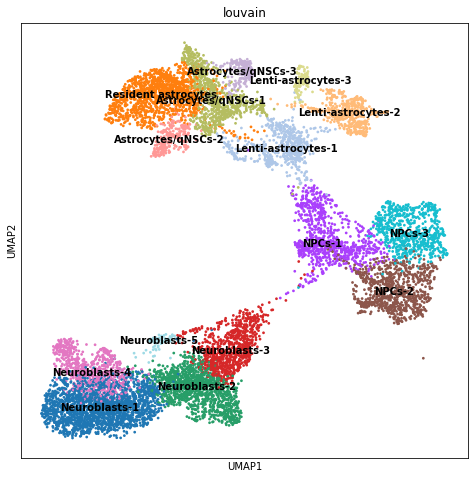

In [208]:
sc.pl.umap(adata_neural, color=['louvain'], size=30, legend_loc='on data', 
          save='_MT_louvain.pdf'
          )

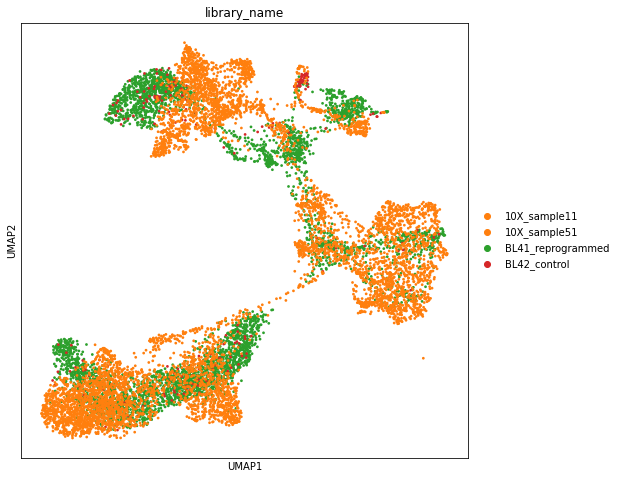

In [209]:
sc.pl.umap(adata_neural, color=['library_name'], size=30, 
           save='_MT_library.pdf'
          )

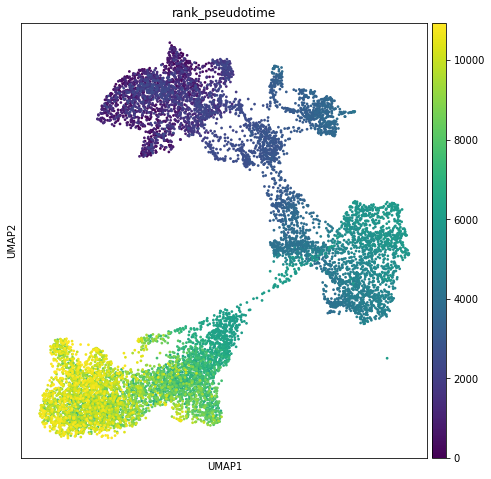

In [210]:
sc.pl.umap(adata_neural, color=['rank_pseudotime'], legend_loc='on data', size=30,
          save='_MT_rank_pseudotime.pdf'
          )

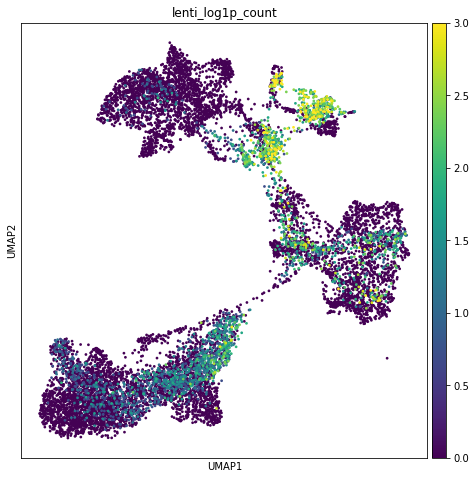

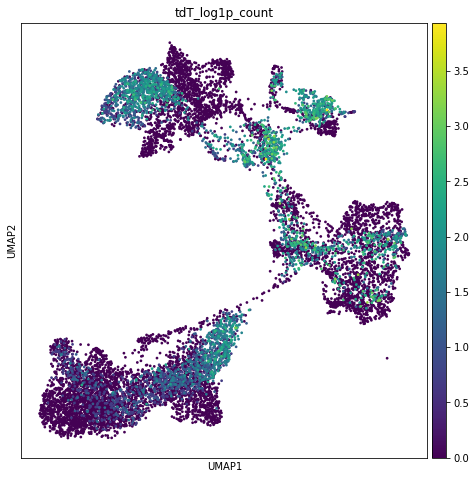

In [11]:
# Visualize lentivirus and tdT expression levels
sc.pl.umap(adata_neural, color='lenti_log1p_count', size=30, vmax=3, 
          save='_AllNeural_lenti_log1p_count.pdf'
          )
sc.pl.umap(adata_neural, color='tdT_log1p_count', size=30,
          save='_AllNeural_tdT_log1p_count.pdf'
          )

In [9]:
# Calculate order of Louvain clusters based on their median pseudotime
pseudotime_median = []
for cluster in adata_neural.obs['louvain'].cat.categories:
    pseudotime_median.append(adata_neural.obs['dpt_pseudotime'][adata_neural.obs['louvain']==cluster].median())

data = {'clusters': adata_neural.obs['louvain'].cat.categories, 'pseudotime_median': pseudotime_median}

pd_pseudotime = pd.DataFrame(data=data)

pd_pseudotime.sort_values(by='pseudotime_median', inplace=True)

In [ ]:
# Plot pseudotime in each cluster
sc.pl.violin(adata_neural, 'dpt_pseudotime', groupby='louvain', use_raw=True, rotation=90, order=pd_pseudotime['clusters'], 
            save='_MT_pseudotime.pdf')

In [212]:
adata_neural.write(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

### 5.4 Examine known adult neurogenesis genes in dataset

In [8]:
adata_neural = sc.read(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

In [9]:
adata_neural

AnnData object with n_obs × n_vars = 10938 × 2500 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'doublet_scores', 'predicted_doublets', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'dendrogram_louvain', 'diffmap_evals', 'iroot', 'library_name_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'Harmony', 'X_diffmap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [10]:
neural_data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/Revision/NeuralOnly/'

In [11]:
adata_neural = sc.read(neural_data_dir + 'NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

In [12]:
adata_neural.obs

,library_name,batch,lenti_count,lenti_log1p_count,tdT_count,tdT_log1p_count,doublet_scores,predicted_doublets,n_counts,log_counts,n_genes,mt_count,mt_frac,n_counts_all,louvain,dpt_pseudotime,rank_pseudotime
index,,,,,,,,,,,,,,,,,
AAACCCACACAGGATG-1,BL41_reprogrammed,experiment,3.0,1.386294,4.0,1.609438,0.033644,False,4279.0,8.361475,1854,173.0,0.040430,1766.219971,Neuroblasts-3,0.383729,6148
AAACCCATCCCACAGG-1,BL41_reprogrammed,experiment,1.0,0.693147,1.0,0.693147,0.020183,False,3481.0,8.155075,1887,169.0,0.048549,1710.497559,Neuroblasts-1,0.474237,10412
AAACGAAGTGGAGAAA-1,BL41_reprogrammed,experiment,0.0,0.000000,0.0,0.000000,0.014823,False,1686.0,7.430114,851,137.0,0.081257,763.143127,Lenti-astrocytes-1,0.054054,2370
AAACGCTCATTAGGAA-1,BL41_reprogrammed,experiment,17.0,2.890372,12.0,2.564949,0.051020,False,10217.0,9.231809,3579,1359.0,0.133014,3633.897217,Lenti-astrocytes-1,0.129169,2850
AAACGCTGTAGACAAT-1,BL41_reprogrammed,experiment,2.0,1.098612,4.0,1.609438,0.095694,False,4476.0,8.406485,2304,387.0,0.086461,2070.232910,Lenti-astrocytes-1,0.123298,2757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACACGACGAA-4,10X_sample51,10X,0.0,0.000000,0.0,0.000000,0.033898,False,5261.0,8.568076,2349,103.0,0.019578,2278.163818,Resident astrocytes,0.007506,361
TTTGTCACATATGCTG-4,10X_sample51,10X,0.0,0.000000,0.0,0.000000,0.325527,False,8643.0,9.064505,3096,295.0,0.034132,3213.966553,NPCs-1,0.277728,5499
TTTGTCAGTACCGTAT-4,10X_sample51,10X,0.0,0.000000,0.0,0.000000,0.013699,False,3585.0,8.184514,1795,54.0,0.015063,1683.407471,Neuroblasts-2,0.451825,8645


#### 5.4.1 Markers from Dulken et al., 2017

In [217]:
# Rpl32 and Egfr have to be manually added to .obs. Otherwise, scanpy doesn't plot them correctly. 
for gene in ['Rpl32', 'Egfr']:

    adata_neural.obs[gene] = adata_neural.raw[:,gene].X

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


In [218]:
# Split dataset based on their origin
adata_10X = adata_neural[adata_neural.obs['batch']=='10X']

adata_experiment = adata_neural[adata_neural.obs['batch']=='experiment']

adata_DLX2 = adata_neural[adata_neural.obs['library_name']=='BL41_reprogrammed']

In [219]:
genes_to_plot = ['Id3', 'Clu', 'Rpl32', 'Egfr', 'Cdk1', 'Ccna2', 'Mki67', 'Dlx1', 'Dlx2', 'Dcx', 'Dlx6os1']

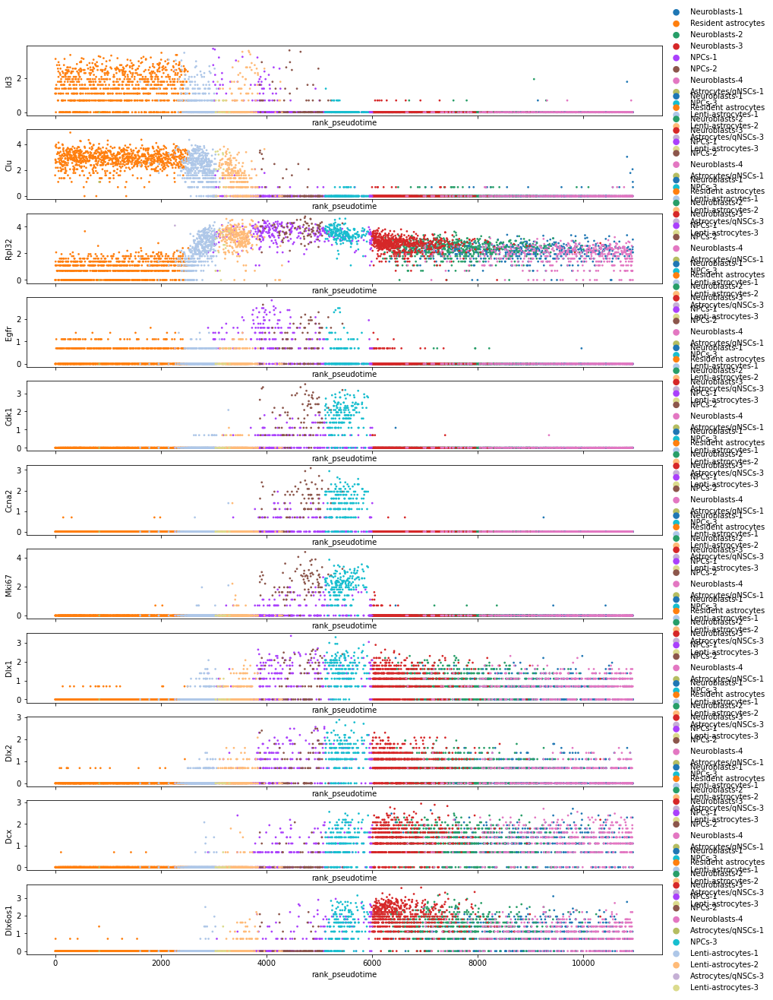

In [222]:
# Plot these genes in lenti-DLX2 cells
# Figure 3D
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_DLX2, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_Dulken_markers_pseudotime_BL41lOnly.pdf')

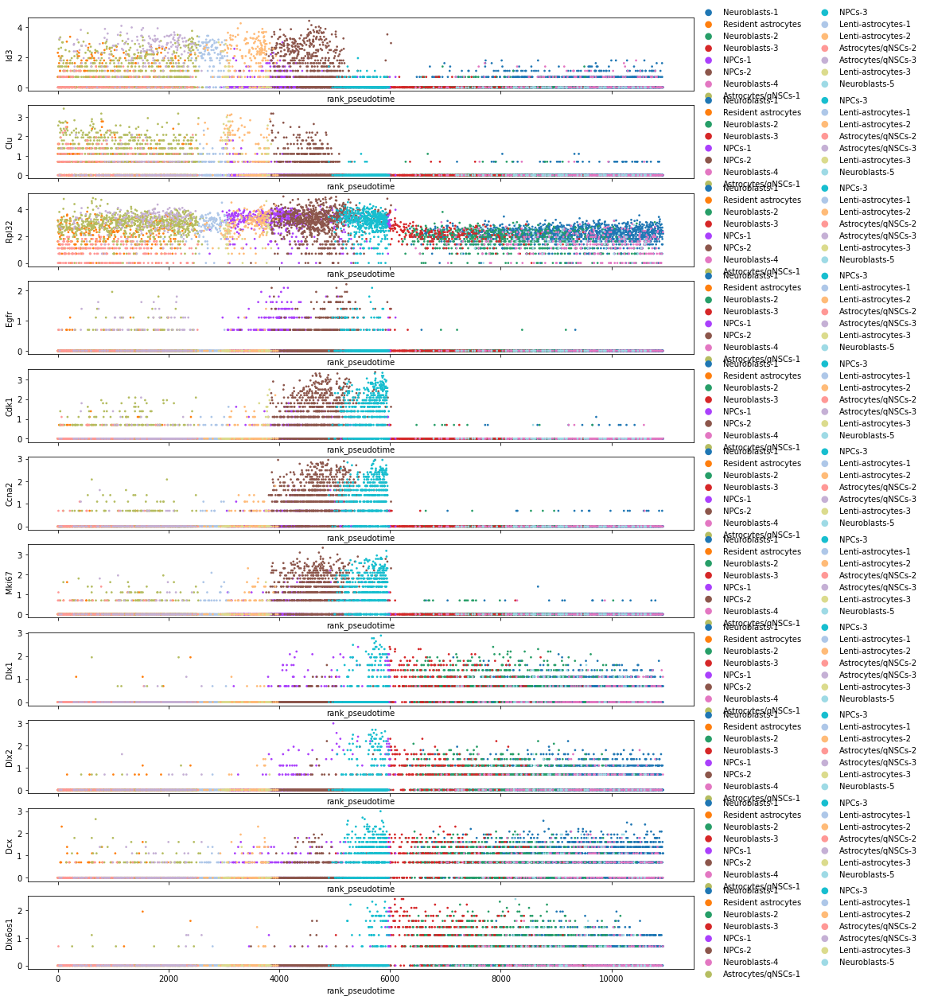

In [223]:
# Plot these genes WT E18.5 cells
# Figure S4A
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_10X, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_Dulken_markers_pseudotime_10XOnly.pdf')

#### 5.4.2 Markers from Shin et al., 2015

In [224]:
genes_to_plot = ['Gfap', 'Apoe', 'Aldoc', 'Hopx',# qNSC
                 'Sox11', 'Eomes', 'Stmn1' # aNSC
                 ]

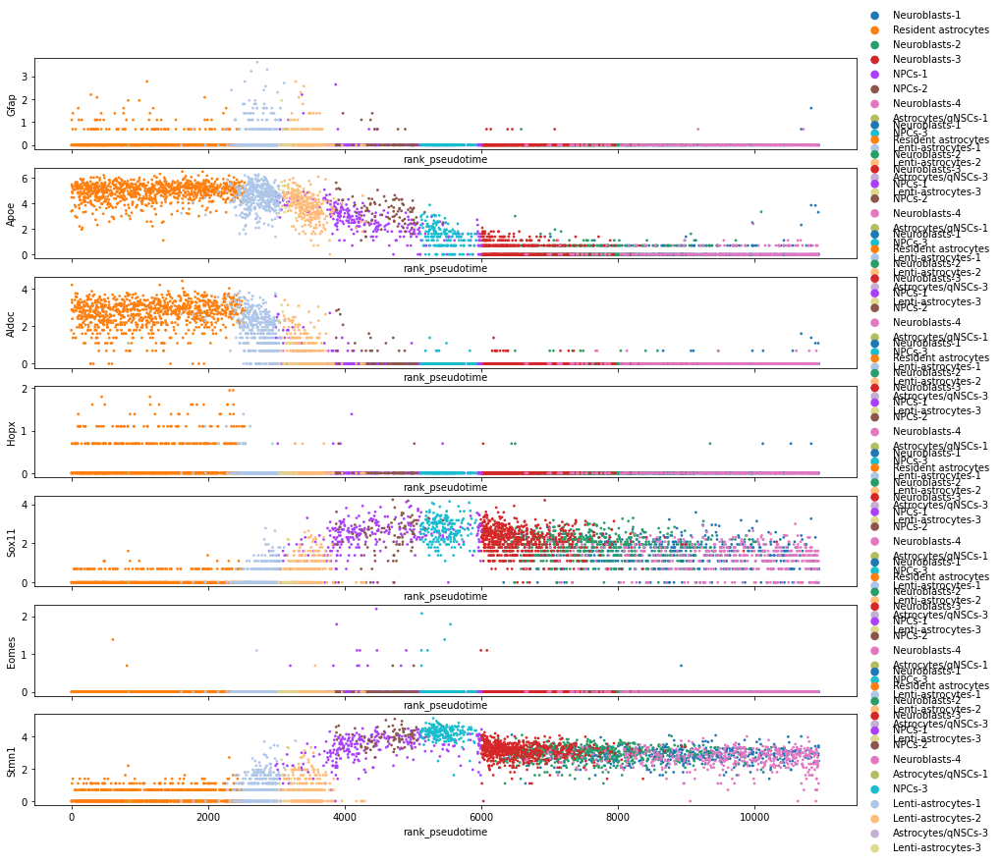

In [225]:
# Plot these genes in lenti-DLX2 cells
# Figure S4B
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_DLX2, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_Shin_markers_pseudotime_BL41lOnly.pdf')

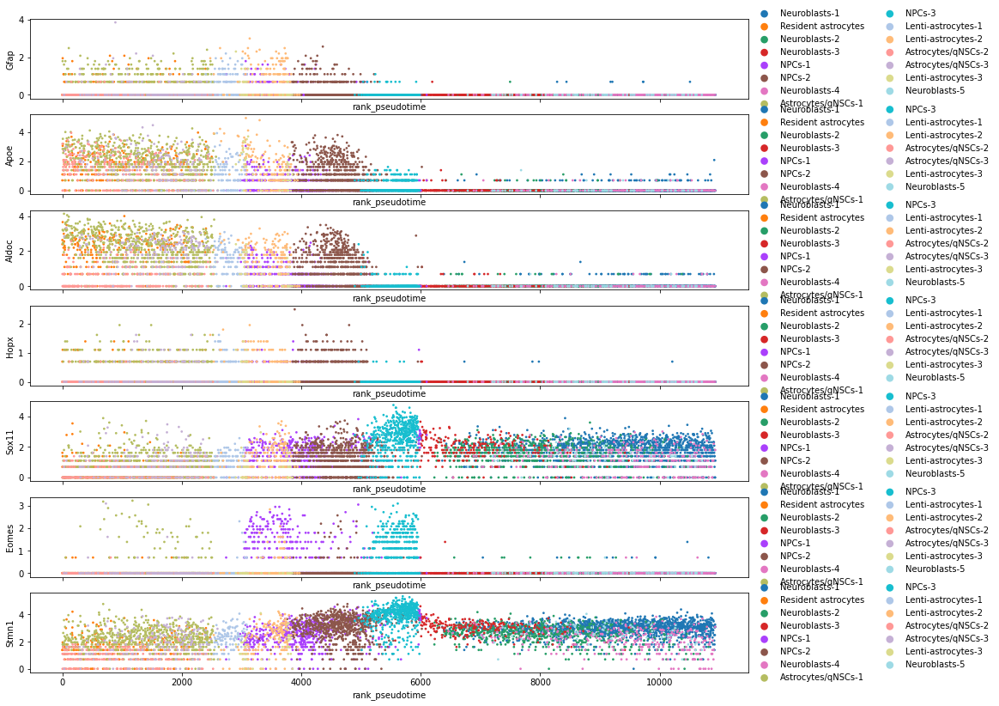

In [226]:
# Plot these genes in WT E18.5 cells
# Figure S4C
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_10X, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_Shin_markers_pseudotime_10XOnly.pdf')

#### 5.4.3 Markers from Hochgerner et al., 2018

In [228]:
# From Hochgerner et al. Fig. 2d
genes_to_plot = ['Aqp4', # Astrocytes
                 'Aldoc', # Astrocytes and RGL
                 'Cdk1', 'Mki67', # nIPC
                 'Eomes', # nIPC and NB1
                 'Neurod2' # NB2
                 ]

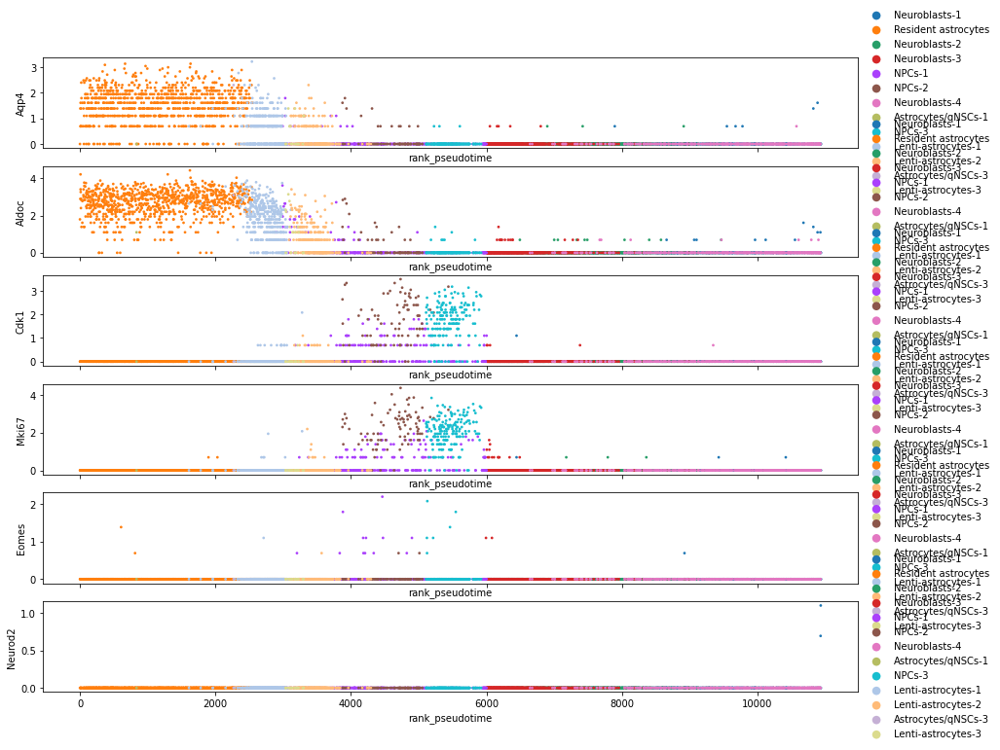

In [229]:
# Plot these genes in lenti-DLX2 cells
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_DLX2, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_Hochgerner_fig2_markers_pseudotime_BL41lOnly.pdf')

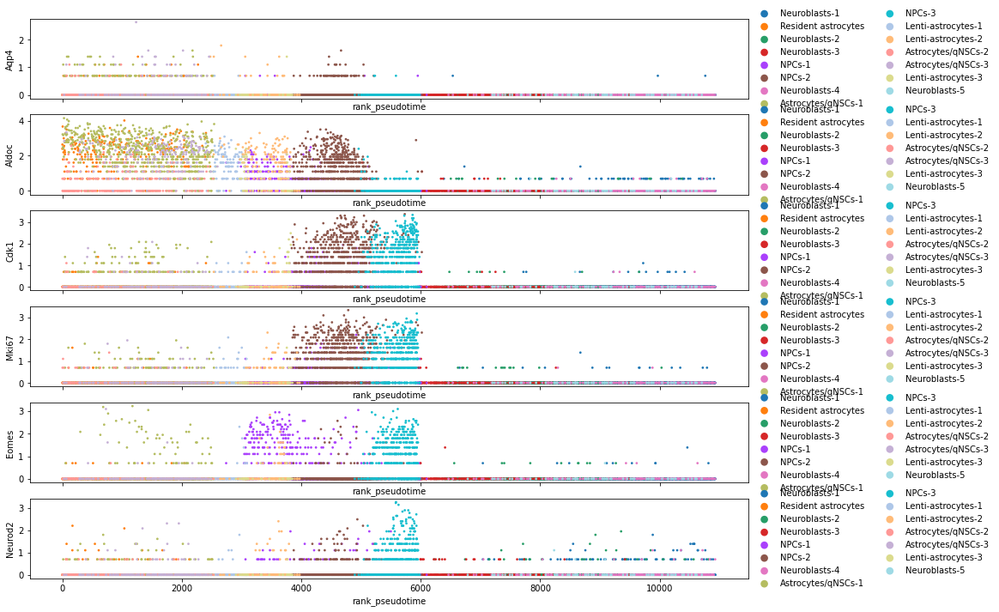

In [230]:
# Plot these genes in WT E18.5 cells
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(15,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_10X, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
plt.savefig('./figures/scatter_Hochgerner_fig2_markers_pseudotime_10XOnly.pdf')

#### 5.4.4 Other marker genes

In [235]:
genes_to_plot = ['Gfap', 'Ascl1', 'Cdk1', 'Mki67', 'Dcx', 'Calb2']

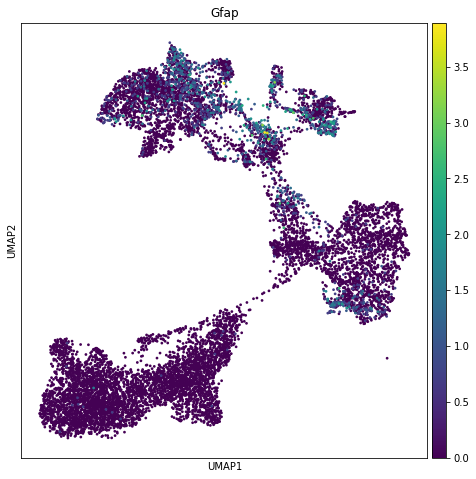

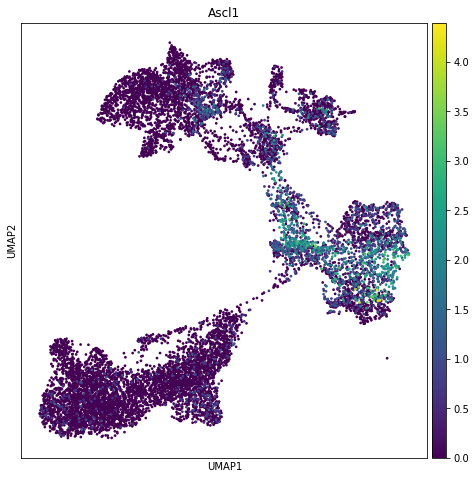

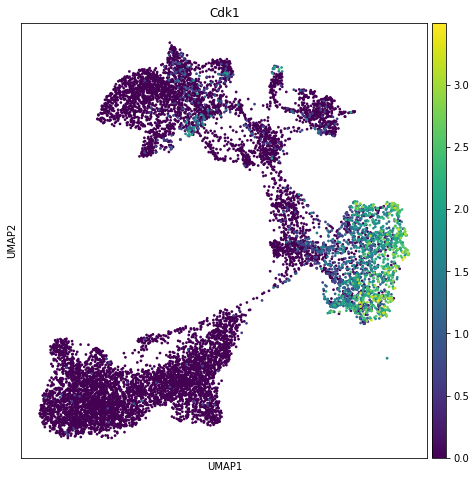

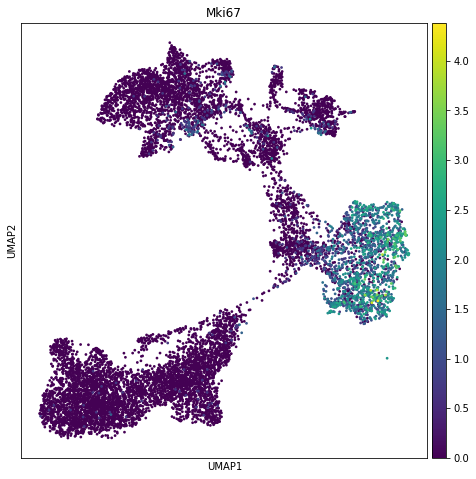

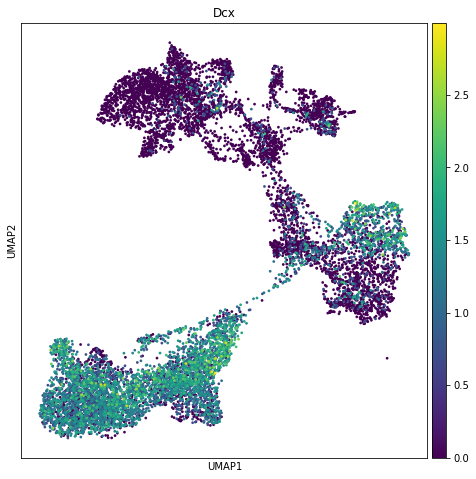

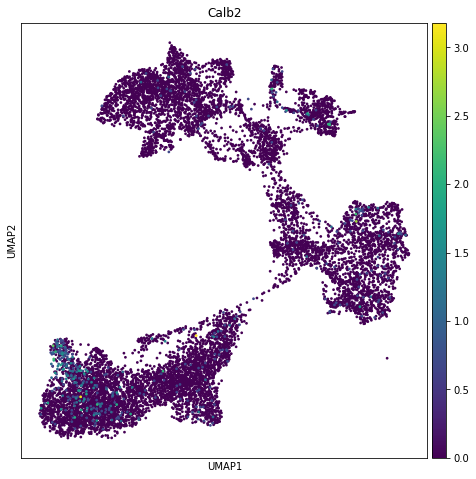

In [236]:
# Figure S3DEFGH
for gene in genes_to_plot:
    sc.pl.umap(adata_neural, color=gene, legend_loc='on data', size=30, use_raw=True, 
              save='_MT_'+gene+'.pdf'
              )

# Misc

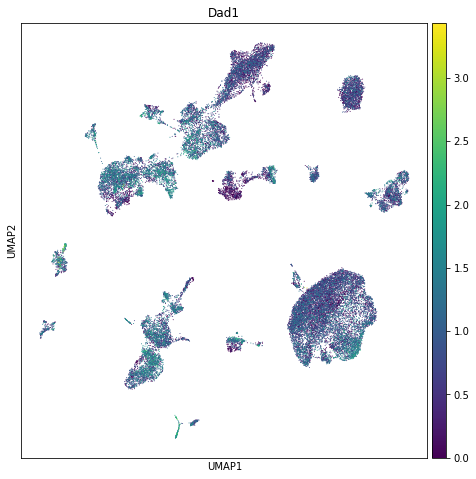

In [8]:
sc.pl.umap(adata, color='Dad1', use_raw=True)